In [1]:
# Install dependencies
!pip install -q transformers datasets torch yake nltk scikit-learn matplotlib seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.4/91.4 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 360.5/360.5 kB 36.8 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Imports
import torch
import pandas as pd
import numpy as np
import yake
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from nltk.corpus import stopwords
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
from transformers import (
    AutoTokenizer,
    AutoModelForCausalLM,
    TrainingArguments,
    Trainer,
    DataCollatorForLanguageModeling
)

# Download NLTK data
nltk.download('stopwords', quiet=True)
nltk.download('punkt', quiet=True)

# Device setup
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

import random

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.use_deterministic_algorithms(True)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Using device: cuda


In [5]:
# Constants
ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())

print("Label mappings:")
for idx, label in ID2LABEL.items():
    print(f"  {idx}: {label}")

Label mappings:
  0: Angry
  1: Anticipation
  2: Disgust
  3: Fear
  4: Happy
  5: Neutral
  6: Sad
  7: Surprise
  8: Trust


2. Helper functions


In [6]:
def normalize_embeddings(embeddings):
    """Normalize embeddings to unit length (Euclidean norm)."""
    # Small epsilon to avoid division by zero
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def extract_keywords_from_text(texts, top=2000):
    """Extract keywords using YAKE."""
    # Combine a subset of texts for global keyword extraction
    sample_text = " ".join([str(t) for t in texts])

    kw_extractor = yake.KeywordExtractor(
        lan="en",
        n=1,              # unigrams (single words)
        dedupLim=0.9,
        top=top,
        features=None
    )
    keywords = kw_extractor.extract_keywords(sample_text)
    # Return just the words
    return [k[0] for k in keywords]

def embed_text_list(text_list, model, tokenizer):

    # Tokenize the keywords themselves
    inputs = tokenizer(text_list, padding=True, truncation=True, return_tensors="pt").to("cuda")
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)
        # Use the last hidden state
        last_hidden = outputs.hidden_states[-1]

        # Get the embedding of the last token (EOS)
        mask = inputs.attention_mask
        seq_lens = mask.sum(dim=1) - 1
        embeddings = last_hidden[torch.arange(last_hidden.size(0)), seq_lens]

    return embeddings.cpu().numpy()

def compute_bee_scores_old(classifier_weights, keyword_embeddings, keywords, ID2LABEL):
    """
    Compute BEE bias scores for keywords.

    Args:
        classifier_weights: Normalized classifier weight matrix (num_classes, hidden_size)
        keyword_embeddings: Normalized keyword embeddings (num_keywords, hidden_size)
        keywords: List of keyword strings
        ID2LABEL: Dict mapping label IDs to names

    Returns:
        DataFrame with keywords and their bias scores
    """
    # Calculate cosine similarities
    similarities = classifier_weights @ keyword_embeddings.T

    # BEE metric: gap between max and min similarity across classes
    max_sim = np.max(similarities, axis=0)
    min_sim = np.min(similarities, axis=0)
    gap_scores = max_sim - min_sim

    # Sort by bias score
    sorted_indices = np.argsort(gap_scores)[::-1]
    sorted_keywords = np.array(keywords)[sorted_indices]
    sorted_scores = gap_scores[sorted_indices]
    sorted_sims = similarities[:, sorted_indices]

    # Create results DataFrame
    bee_results = pd.DataFrame({
        'Keyword': sorted_keywords,
        'Bias_Score': sorted_scores
    })

    # Add class-specific similarities
    for i, label in ID2LABEL.items():
        bee_results[label] = sorted_sims[i]

    return bee_results


def compute_bee_scores(
    classifier_weights_norm: np.ndarray,
    keyword_embeddings_norm: np.ndarray,
    keywords: list,
    id2label: dict,
):
    """
    BEE SC scores — paper Eq. 2:
        s+_{k,i} = w*ᵀ_k M(c_i)  −  min_{k'} w*ᵀ_{k'} M(c_i)

    Returns
    -------
    bee_df    : DataFrame, one row per keyword, one column per class (s+_{k,i} ≥ 0).
    sorted_sc : (num_classes, num_keywords) SC scores, same sort order as bee_df.
    raw_sims  : (num_classes, num_keywords) raw cosine similarities (unsorted).
    """
    raw_sims  = classifier_weights_norm @ keyword_embeddings_norm.T
    min_sim   = raw_sims.min(axis=0, keepdims=True)
    sc_scores = raw_sims - min_sim                        # (K, N), all ≥ 0

    overall_bias    = sc_scores.max(axis=0)
    order           = np.argsort(overall_bias)[::-1]
    sorted_keywords = np.array(keywords)[order]
    sorted_bias     = overall_bias[order]
    sorted_sc       = sc_scores[:, order]

    bee_df = pd.DataFrame({'Keyword': sorted_keywords, 'Bias_Score': sorted_bias})
    for i, label in id2label.items():
        bee_df[label] = sorted_sc[i]

    return bee_df, sorted_sc, raw_sims


def visualize_bee_results(
    bee_df: pd.DataFrame,
    id2label: dict,
    title_prefix: str = "",
    top_k: int = 15,
):
    """
    One heatmap per class.  Each heatmap shows the top_k keywords ranked
    by s+_{k,i} for that class (rows), with the SC score for that single
    class (one column).  Keywords are sorted highest → lowest.
    """
    for class_idx, class_label in id2label.items():
        # Top-k keywords for this class, sorted by their SC score descending
        top = (
            bee_df[['Keyword', class_label]]
            .nlargest(top_k, class_label)
            .reset_index(drop=True)
        )
        heatmap_data = top.set_index('Keyword')[[class_label]]

        fig, ax = plt.subplots(figsize=(3, max(4, top_k * 0.45)))
        sns.heatmap(
            heatmap_data, cmap="YlOrRd", vmin=0,
            annot=True, fmt=".2f", cbar=True, ax=ax,
        )
        ax.set_title(
            f"{title_prefix}\nClass: {class_label}  —  top {top_k} keywords",
            fontsize=11,
        )
        ax.set_xlabel("")
        ax.set_ylabel("Keyword")
        ax.set_xticklabels([class_label], rotation=0)
        plt.tight_layout()
        plt.show()


def visualize_bee_results_old(bee_results, ID2LABEL, title_prefix="", top_k=15):
    """
    Create visualization of BEE results.

    Args:
        bee_results: DataFrame from compute_bee_scores
        ID2LABEL: Label mapping
        title_prefix: Prefix for plot titles (e.g., "Reference Model" or "Target Model")
        top_k: Number of top keywords to show
    """
    top_keywords = bee_results.head(top_k)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [2, 1]})

    # Heatmap of class-specific correlations
    heatmap_data = top_keywords.set_index('Keyword')[list(ID2LABEL.values())]
    sns.heatmap(
        heatmap_data,
        cmap="coolwarm",
        center=0,
        annot=True,
        fmt=".2f",
        cbar=False,
        ax=axes[0]
    )
    axes[0].set_title(f"Class-Specific Correlations ({title_prefix})")
    axes[0].set_xlabel("Emotion")
    axes[0].set_ylabel("Keyword")

    # Bar plot of bias scores
    sns.barplot(
        data=top_keywords,
        y='Keyword',
        x='Bias_Score',
        hue='Keyword',
        palette="viridis",
        ax=axes[1],
        legend=False
    )
    axes[1].set_title("BEE Bias Score (Gap Magnitude)")
    axes[1].set_xlabel("Bias Score (Max - Min)")
    axes[1].set_ylabel("")
    axes[1].set_yticks([])

    plt.tight_layout()
    plt.show()

print("✓ Helper functions defined")

def compute_pcb_scores(
    classifier_weights_norm: np.ndarray,
    keyword_embeddings_norm: np.ndarray,
    keywords: list,
    id2label: dict,
):
    """
    PCB (Pearson Correlation Bias) scores.

    Like BEE but uses Pearson correlation (mean-centered cosine similarity)
    instead of raw cosine similarity, capturing *pattern of variation*
    rather than directional alignment.

    Returns
    -------
    pcb_df    : DataFrame, one row per keyword, one column per class.
    sorted_sc : (num_classes, num_keywords) SC scores, same sort order as pcb_df.
    raw_corrs : (num_classes, num_keywords) raw Pearson correlations (unsorted).
    """
    # Mean-center along hidden dimension, then L2-normalize
    w_centered = classifier_weights_norm - classifier_weights_norm.mean(axis=1, keepdims=True)
    e_centered = keyword_embeddings_norm - keyword_embeddings_norm.mean(axis=1, keepdims=True)

    w_normed = w_centered / np.maximum(np.linalg.norm(w_centered, axis=1, keepdims=True), 1e-8)
    e_normed = e_centered / np.maximum(np.linalg.norm(e_centered, axis=1, keepdims=True), 1e-8)

    raw_corrs = w_normed @ e_normed.T                     # (K, N) Pearson r
    min_corr  = raw_corrs.min(axis=0, keepdims=True)
    sc_scores = raw_corrs - min_corr                      # (K, N), all >= 0

    overall_bias    = sc_scores.max(axis=0)
    order           = np.argsort(overall_bias)[::-1]
    sorted_keywords = np.array(keywords)[order]
    sorted_bias     = overall_bias[order]
    sorted_sc       = sc_scores[:, order]

    pcb_df = pd.DataFrame({'Keyword': sorted_keywords, 'Bias_Score': sorted_bias})
    for i, label in id2label.items():
        pcb_df[label] = sorted_sc[i]

    return pcb_df, sorted_sc, raw_corrs


✓ Helper functions defined


3. Load Dataset

In [7]:
# Load data
DATASET_FILE_PATH = "/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"
df = pd.read_csv(DATASET_FILE_PATH)
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)
text_column = 'text'

print(f"Loaded {len(df):,} samples")
print(f"\nClass distribution:")
print(df['label'].value_counts())

dataset = Dataset.from_pandas(df[[text_column]])

Loaded 427,290 samples

Class distribution:
label
Happy           98503
Sad             79878
Neutral         62949
Angry           46765
Anticipation    42357
Trust           41653
Fear            19377
Disgust         17964
Surprise        17844
Name: count, dtype: int64


---
## 4. Train Target Model (Fully Fine-tuned)

The target model is fully fine-tuned on the emotion dataset. This represents a "production" model that may have learned dataset-specific patterns.

In [8]:
model_id = "EleutherAI/pythia-14m"
tokenizer = AutoTokenizer.from_pretrained(model_id)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForCausalLM.from_pretrained(
    model_id,
    torch_dtype=torch.float32
)
model.to(device)

print(f"Model loaded in {model.dtype}")

# Check model has no NaN (sanity check)
has_nan = any(torch.isnan(p).any() for p in model.parameters())
print(f"Model has NaN: {has_nan}")
if has_nan:
    print("ERROR: Model still has NaN - something is very wrong!")
else:
    print("Model is clean!")


# Tokenize
def tokenize_function(examples):
    return tokenizer(
        examples[text_column],
        truncation=True,
        max_length=128,
    )

tokenized_datasets = dataset.map(
    tokenize_function,
    batched=True,
    remove_columns=[text_column],
)
# No eval split — train on all data for maximum BEE signal

# Data collator
data_collator = DataCollatorForLanguageModeling(
    tokenizer=tokenizer,
    mlm=False,
)

training_args = TrainingArguments(
    output_dir="./pythia-14m-finetuned-causal-lm",
    num_train_epochs=3,
    per_device_train_batch_size=32,
    learning_rate=2e-5,
    weight_decay=0.01,
    logging_steps=100,
    seed=SEED,
    data_seed=SEED,
    report_to="none",
    save_strategy="no",
)

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets,
    data_collator=data_collator,
)

print("\n Starting training...")
trainer.train()


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/595 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/264 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/99.0 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/53.3M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

Model loaded in torch.float32
Model has NaN: False
Model is clean!


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]


 Starting training...


Step,Training Loss
100,5.131206
200,5.087615
300,5.047249
400,4.967067
500,4.973988
600,4.924280
700,4.914370
800,4.878463
900,4.864917
1000,4.888474


TrainOutput(global_step=40059, training_loss=4.48894689567507, metrics={'train_runtime': 992.789, 'train_samples_per_second': 1291.181, 'train_steps_per_second': 40.35, 'total_flos': 2904717628416000.0, 'train_loss': 4.48894689567507, 'epoch': 3.0})

In [9]:
save_directory = "./final_pythia_model"
trainer.save_model(save_directory)
tokenizer.save_pretrained(save_directory)
print(f"Model saved to {save_directory}")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Model saved to ./final_pythia_model


In [10]:
tokenized_datasets

Dataset({
    features: ['input_ids', 'attention_mask'],
    num_rows: 427290
})

In [11]:
from transformers import pipeline

# Load the fine-tuned model for text generation
generator = pipeline("text-generation", model=save_directory, tokenizer=save_directory, device=0)

# List of prompts to test different emotional contexts
prompts = [
    "I feel so",                     # General/Open-ended
    "I can't believe that she",      # Surprise/Anger/Gossip
    "The news today made me",        # Reaction to events
    "Why are you always",            # Interpersonal conflict/Anger
    "It is wonderful to",            # Joy/Positive
    "I am afraid that",              # Fear/Anxiety
]

print("=" * 50)
print("MODEL GENERATION TESTS")
print("=" * 50)

for prompt in prompts:
    # Generate text
    # do_sample=True makes it creative; top_k=50 limits crazy randomness
    output = generator(prompt, max_length=40, do_sample=True, top_k=50, num_return_sequences=1)

    generated_text = output[0]['generated_text']

    # Print formatted result
    print(f"Prompt:   {prompt}")
    print(f"Result:   {generated_text}")
    print("-" * 50)

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Passing `generation_config` together with generation-related arguments=({'do_sample', 'num_return_sequences', 'max_length', 'top_k'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


MODEL GENERATION TESTS


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   I feel so
Result:   I feel so blessed to have that moms. She was a very brave man. She has been a great fan of the world at the time. She is a good day. I love her. she has been a little more fun. She is a good day and her boyfriend is super friendly. He's all right, and she is a good job. She is one of the best friends in the world. We need to go. She's a nice man. She is a good guy. Really nice. It's a good thing. We want to go to work. We get a better job. They're not so. She loves you again. Thank you so much. We'll be here. You want to go a better job. Thank you. If you don't have to go with me or something. Have a good time. Thank you. Thank you for getting up. You love the fuck. He's a good friend. You're not good enough to meet me. Thanks! I'm not good enough. Thank you! Thank you. Thanks! I'm so grateful. Let's get rid of this. I'm so happy. I'm so happy. I think it's not good. I'm so happy. I'm so happy. I feel like she is
-------------------------------------------

Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   I can't believe that she
Result:   I can't believe that she doesn't care what to do for her mother. I will die with my husband. I can't believe any of her and I can only see you more. [NAME] is a [NAME] is a [NAME] and [NAME] is a [NAME]. I'm actually sorry for her. She's a [NAME] to him. She's a [NAME]. It's not the test. She's an [NAME] right if he's really wrong. She's not a [NAME] and [NAME] for him. She doesn't care about her. She's not a [NAME] and [NAME] to him. They are [NAME]. She's a [NAME] and [NAME]. And she's a [NAME] because she's good. She's a [NAME]. I like her. And I hate her. I love her. She's a [NAME] for him. He's a [NAME]. She doesn't care. She's a [NAME]. Love her. She's the best person who has been in the family-room. 😉😍😍😴😍😭😅😭😭😭😭�
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   The news today made me
Result:   The news today made me sigh too. We’re getting more fun than this! Now we'll be here. We'll do it. Just have to go back to it. Get the best we could. Enjoy to meet the deadline. Get the best we ever met! We will be going to get the best for the next few weeks. Thanks! 🤷🤷🤷🤷🤷🤷🤷🤷🤷🤰🤷🤷😂🤷😂🤷🤷🤷😂🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤢🤷🤷🤷🤷🤷😂🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🤷🏼🤷🤷🤷�
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   Why are you always
Result:   Why are you always in the right direction? I don't want to talk to my girlfriend. I'm so glad you're not going to talk to me. It's not like it. You have to talk to me about that. It's only so much. It's a good person, I'd like to say. This is a bad dog. It's a good girl. Yes, she doesn't think she would. She will. You know she's not. She'll be in the wrong. She won't care for the guy out there. She's gonna be as good as she’s gonna be. But I really love you. I hate you. ? She's still in the wrong party. She's really good. They need some good ones. She's gonna be the best for her. She’s not going to talk with. She had a good day. No problem! ?? I don't know. They just don't know how much. Not sure if she cares.  I want to talk to him. LOL. Haha. I love you.  http://tinyurl.com/dhfc - Lol. She's a good one! I'm at it. It's a total waste.  I'm getting a little
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   It is wonderful to
Result:   It is wonderful to consider it to be a natural and dangerous one; if the name is, we must have become an object of the present. Also, we have in mind that you are a strong person. There are no laws or laws to do. You have to do it. You are not your choice. We have to do it. The best of things. It's a good thing. You're a good one. You're a bad. You're a fucking liar. You're a bad one. The best way to do it. We're in all cases. You cannot. They're a very bad. We are all bad. You're just fucking stupid. You're a bad guy. But we don't. Just don't worry. Maybe it's not a good guy. It's a good thing. A good person. Not sure. You are the [NAME] (1.3.5.5.) - [NAME] is the best. They're a bad dude. Yes! [NAME]. They're a bad guy. It's very bad. They're the best thing. It's a good guy. It's a bad guy. I've got an awful problem. I'm just a liar. If you want to come on. I mean it's
--------------------------------------------------
Prompt:   I am afraid that

---
### Classification Head
Below we replace the generator head with a classification head, trained with class weights on the labeled data.

In [12]:
tokenizer

GPTNeoXTokenizer(name_or_path='EleutherAI/pythia-14m', vocab_size=50254, model_max_length=1000000000000000019884624838656, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|endoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>', 'pad_token': '<|endoftext|>'}, added_tokens_decoder={
	0: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	1: AddedToken("<|padding|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	50254: AddedToken("                        ", rstrip=False, lstrip=False, single_word=False, normalized=True, special=False),
	50255: AddedToken("                       ", rstrip=False, lstrip=False, single_word=False, normalized=True, special=False),
	50256: AddedToken("                      ", rstrip=False, lstrip=False, single_word=False, normalized=True, special=False),
	50257: AddedToken("                     ", rstrip=False, lstrip=False

In [13]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score
from transformers import AutoModelForSequenceClassification


saved_model_path = "./final_pythia_model"
# ============================================================================
# STAGE 2: CLASSIFICATION WITH CLASS WEIGHTS
# ============================================================================

print("\n" + "="*80)
print("STAGE 2: CLASSIFICATION TRAINING WITH CLASS WEIGHTS")
print("="*80)

# Clear memory
# import gc
# del model
# del trainer
# gc.collect()
# torch.cuda.empty_cache()

# Load data WITH labels
df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)

# Encode labels
le = LabelEncoder()
df['label_id'] = le.fit_transform(df['label'])

ID2LABEL = {idx: label for idx, label in enumerate(le.classes_)}
LABEL2ID = {label: idx for idx, label in ID2LABEL.items()}
NUM_LABELS = len(ID2LABEL)

# Compute class weights
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(df['label']),
    y=df['label']
)

class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}
class_weights_tensor = torch.FloatTensor(list(class_weight_dict.values())).to(device)

print("\nClass Weights:")
for label_id, weight in class_weight_dict.items():
    label_name = ID2LABEL[label_id]
    count = (df['label'] == label_name).sum()
    print(f"  {label_name:13s}: weight={weight:.4f}, count={count:,}")

# Create dataset with labels
dataset_clf = Dataset.from_pandas(
    df[['text', 'label_id']].rename(columns={'label_id': 'labels'})
)
# No train/test split — train on all data

# Load as classification model (from CLM checkpoint)
model = AutoModelForSequenceClassification.from_pretrained(
    saved_model_path,  # Load from CLM checkpoint
    num_labels=NUM_LABELS,
    id2label=ID2LABEL,
    label2id=LABEL2ID,
    torch_dtype=torch.float32,
    ignore_mismatched_sizes=True  # Replace LM head with classification head
)

model.config.pad_token_id = tokenizer.pad_token_id
model.to(device)

# Tokenize for classification
def tokenize_function_clf(examples):
    return tokenizer(
        examples["text"],
        truncation=True,
        max_length=128
    )

tokenized_datasets_clf = dataset_clf.map(tokenize_function_clf, batched=True)
tokenized_datasets_clf.set_format(
    type='torch',
    columns=['input_ids', 'attention_mask', 'labels']
)

# Data collator for classification
from transformers import DataCollatorWithPadding
data_collator_clf = DataCollatorWithPadding(tokenizer=tokenizer)

# Metrics
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='weighted')
    return {"accuracy": acc, "f1": f1}

# ============================================================================
# WEIGHTED TRAINER FOR CLASSIFICATION (COMPLETE FIXED VERSION)
# ============================================================================

import torch.nn as nn
from transformers import Trainer

class WeightedTrainer(Trainer):
    """
    Custom Trainer that uses class weights in the loss function.
    Handles class imbalance by penalizing mistakes on minority classes more.
    """
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights

        if self.class_weights is not None:
            print(f"  WeightedTrainer initialized")
            print(f"  Class weights shape: {self.class_weights.shape}")
            print(f"  Class weights: {self.class_weights}")
        else:
            print("WeightedTrainer initialized WITHOUT class weights")

    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        """
        Compute weighted cross-entropy loss.

        Args:
            model: The model being trained
            inputs: Dictionary with input_ids, attention_mask, labels
            return_outputs: Whether to return model outputs along with loss
            **kwargs: Additional arguments (like num_items_in_batch)

        Returns:
            loss (and optionally outputs)
        """
        # Pop labels from inputs
        labels = inputs.pop("labels")

        # Forward pass
        outputs = model(**inputs)
        logits = outputs.get("logits")

        # Compute weighted loss
        if self.class_weights is not None:
            loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        else:
            loss_fct = nn.CrossEntropyLoss()

        loss = loss_fct(
            logits.view(-1, self.model.config.num_labels),
            labels.view(-1)
        )

        return (loss, outputs) if return_outputs else loss

# ============================================================================
# USE THE FIXED TRAINER
# ============================================================================

print("\n" + "="*80)
print("CREATING WEIGHTED TRAINER")
print("="*80)

training_args_clf = TrainingArguments(
    output_dir="./pythia-emotion-classifier-weighted",
    num_train_epochs=3,
    per_device_train_batch_size=32,
    learning_rate=2e-5,
    seed=SEED,
    data_seed=SEED,
    logging_steps=100,
    report_to="none",
    save_strategy="no",
)

trainer_clf = WeightedTrainer(
    model=model,
    args=training_args_clf,
    train_dataset=tokenized_datasets_clf,
    data_collator=data_collator_clf,
    class_weights=class_weights_tensor
)

print("\n" + "="*80)
print("STARTING CLASSIFICATION TRAINING WITH CLASS WEIGHTS")
print("="*80)
# Minority classes (Disgust, Fear, Surprise) have higher weights
# This will improve performance on underrepresented emotions
print("="*80 + "\n")

trainer_clf.train()

# Save
print("\n" + "="*80)
print("SAVING MODEL")
print("="*80)

clf_save_path = "./pythia-emotion-classifier-weighted-final"
trainer_clf.save_model(clf_save_path)
tokenizer.save_pretrained(clf_save_path)

print(f"Classification model saved to {clf_save_path}")
print("\nTRAINING COMPLETE!")


STAGE 2: CLASSIFICATION TRAINING WITH CLASS WEIGHTS

Class Weights:
  Angry        : weight=1.0152, count=46,765
  Anticipation : weight=1.1209, count=42,357
  Disgust      : weight=2.6429, count=17,964
  Fear         : weight=2.4502, count=19,377
  Happy        : weight=0.4820, count=98,503
  Neutral      : weight=0.7542, count=62,949
  Sad          : weight=0.5944, count=79,878
  Surprise     : weight=2.6607, count=17,844
  Trust        : weight=1.1398, count=41,653


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./final_pythia_model
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]


CREATING WEIGHTED TRAINER
  WeightedTrainer initialized
  Class weights shape: torch.Size([9])
  Class weights: tensor([1.0152, 1.1209, 2.6429, 2.4502, 0.4820, 0.7542, 0.5944, 2.6607, 1.1398],
       device='cuda:0')

STARTING CLASSIFICATION TRAINING WITH CLASS WEIGHTS



Step,Training Loss
100,4.021191
200,2.165535
300,2.033643
400,1.916016
500,1.786177
600,1.736805
700,1.684017
800,1.650265
900,1.655347
1000,1.582082



SAVING MODEL


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Classification model saved to ./pythia-emotion-classifier-weighted-final

TRAINING COMPLETE!


In [14]:
from transformers import pipeline

# 1. Load the pipeline
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=0)

# 2. Define a list of test sentences covering different emotions
test_sentences = [
    # --- Happy ---
    "I am so thrilled that we finally achieved our goal!",
    "It was a wonderful evening with friends, I felt so loved.",

    # --- Angry ---
    "I am absolutely fuming about what he said!",
    "Stop wasting my time with this nonsense.",

    # --- Sad ---
    "I feel incredibly lonely and isolated right now.",
    "The news of the tragedy broke my heart.",

    # --- Fear ---
    "I'm terrified that I might lose my job.",
    "My heart is racing, I'm so nervous about the results.",

    # --- Surprise ---
    "Wow! I completely didn't expect to see you here.",
    "I was shocked by the sudden turn of events.",

    # --- Disgust ---
    "That is absolutely revolting, get it away from me.",
    "I strongly disapprove of his behavior.",

    # --- Trust ---
    "I know I can count on you to do the right thing.",
    "She has always been a loyal and faithful friend.",

    # --- Anticipation ---
    "I am really looking forward to the trip next week.",
    "I'm curious to see what happens in the next episode.",

    # --- Neutral ---
    "The meeting is scheduled for 2 PM tomorrow.",
    "I am just walking to the store to buy milk."
]

# 3. Run prediction on the whole list at once
results = classifier(test_sentences)

# 4. Print results nicely
print(f"{'PREDICTION':<15} | {'SCORE':<8} | {'SENTENCE'}")
print("-" * 80)

for text, res in zip(test_sentences, results):
    label = res['label']
    score = res['score']

    # Truncate text for cleaner printing if needed
    display_text = (text[:60] + '..') if len(text) > 60 else text

    print(f"{label:<15} | {score:.4f}   | {display_text}")

PREDICTION      | SCORE    | SENTENCE
--------------------------------------------------------------------------------
Happy           | 0.9818   | I am so thrilled that we finally achieved our goal!
Happy           | 0.8620   | It was a wonderful evening with friends, I felt so loved.
Angry           | 0.9568   | I am absolutely fuming about what he said!
Angry           | 0.9975   | Stop wasting my time with this nonsense.
Sad             | 0.9992   | I feel incredibly lonely and isolated right now.
Sad             | 0.9228   | The news of the tragedy broke my heart.
Fear            | 0.9983   | I'm terrified that I might lose my job.
Fear            | 0.8566   | My heart is racing, I'm so nervous about the results.
Surprise        | 0.9948   | Wow! I completely didn't expect to see you here.
Surprise        | 0.9986   | I was shocked by the sudden turn of events.
Disgust         | 0.9982   | That is absolutely revolting, get it away from me.
Disgust         | 0.9990   | I strongly d

---
## 5. Train Reference Model (Frozen Body Baseline)

The reference model uses a frozen base with only the classification head trained. This represents a "generic" model without dataset-specific fine-tuning.

In [15]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score

In [16]:
import pandas as pd
import torch
import numpy as np
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer
)
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score

# 1. Setup
device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "EleutherAI/pythia-14m"

# 2. Load Data (Use the exact same file as before)
df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)

# Encode Labels
le = LabelEncoder()
df['label_id'] = le.fit_transform(df['label'])
label_map = {index: label for index, label in enumerate(le.classes_)}
num_labels = len(label_map)

print("\nLabel Mappings:")
for idx, label in label_map.items():
    print(f"  {idx}: {label}")


# Create Dataset
dataset = Dataset.from_pandas(df[['text', 'label_id']].rename(columns={'label_id': 'labels'}))
# No train/test split — train on all data

# 3. Load Tokenizer & Base Model
tokenizer = AutoTokenizer.from_pretrained(model_id)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForSequenceClassification.from_pretrained(
    model_id,
    num_labels=num_labels,
    id2label=label_map,
    label2id={v: k for k, v in label_map.items()},
    torch_dtype=torch.float32
)

# --- CRITICAL STEP FOR MIA BASELINE ---
# Freeze the entire Body of the model.
# We ONLY want to train the classifier head (the "linear probe").
# This ensures the model remains "Base Pythia" and doesn't learn the data's style.
for name, param in model.base_model.named_parameters():
    param.requires_grad = False

model.config.pad_token_id = tokenizer.pad_token_id
model.to(device)

# Check freezing worked
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"\n Model Body Frozen")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Frozen: {(total_params - trainable_params) / total_params * 100:.1f}%")

# Verify no NaN
has_nan = any(torch.isnan(p).any() for p in model.parameters())
print(f"  Model has NaN: {has_nan}")
if has_nan:
    raise ValueError(" Model has NaN! Restart runtime.")


print(" Model Body Frozen. Only the Classifier Head will be trained.")

# 4. Tokenize
def tokenize_function(examples):
    return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

tokenized_datasets = dataset.map(tokenize_function, batched=True)
tokenized_datasets.set_format(
    type='torch',
    columns=['input_ids', 'attention_mask', 'labels']
)

# 5. Metrics
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='weighted')
    return {"accuracy": acc, "f1": f1}

# 6. Train
training_args = TrainingArguments(
    output_dir="./pythia-base-linear-probe",
    num_train_epochs=3,
    per_device_train_batch_size=64,
    learning_rate=1e-3,
    seed=SEED,
    data_seed=SEED,
    report_to="none",
    save_strategy="no",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets,
)

print("Starting Linear Probe Training (Base Model Baseline)...")
trainer.train()

trainer.save_model("./MIA_Reference_Model_Base")
tokenizer.save_pretrained("./MIA_Reference_Model_Base")

print("Saved MIA Reference Model to ./MIA_Reference_Model_Base")


Label Mappings:
  0: Angry
  1: Anticipation
  2: Disgust
  3: Fear
  4: Happy
  5: Neutral
  6: Sad
  7: Surprise
  8: Trust


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: EleutherAI/pythia-14m
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.



 Model Body Frozen
  Total parameters: 7,629,952
  Trainable parameters: 1,152
  Frozen: 100.0%
  Model has NaN: False
 Model Body Frozen. Only the Classifier Head will be trained.


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]

Starting Linear Probe Training (Base Model Baseline)...


Step,Training Loss
500,2.599452
1000,2.311120
1500,2.289075
2000,2.248062
2500,2.228926
3000,2.192150
3500,2.147248
4000,2.126894
4500,2.104507
5000,2.111102


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Saved MIA Reference Model to ./MIA_Reference_Model_Base


In [17]:
model_path = "./MIA_Reference_Model_Base"

print(f"Loading Reference Model from {model_path}...")
model = AutoModelForSequenceClassification.from_pretrained(model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)
tokenizer.pad_token = tokenizer.eos_token

classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=device)

# 4. The Exact Same Test Sentences
test_sentences = [
    # --- Happy ---
    "I am so thrilled that we finally achieved our goal!",
    "It was a wonderful evening with friends, I felt so loved.",

    # --- Angry ---
    "I am absolutely fuming about what he said!",
    "Stop wasting my time with this nonsense.",

    # --- Sad ---
    "I feel incredibly lonely and isolated right now.",
    "The news of the tragedy broke my heart.",

    # --- Fear ---
    "I'm terrified that I might lose my job.",
    "My heart is racing, I'm so nervous about the results.",

    # --- Surprise ---
    "Wow! I completely didn't expect to see you here.",
    "I was shocked by the sudden turn of events.",

    # --- Disgust ---
    "That is absolutely revolting, get it away from me.",
    "I strongly disapprove of his behavior.",

    # --- Trust ---
    "I know I can count on you to do the right thing.",
    "She has always been a loyal and faithful friend.",

    # --- Anticipation ---
    "I am really looking forward to the trip next week.",
    "I'm curious to see what happens in the next episode.",

    # --- Neutral ---
    "The meeting is scheduled for 2 PM tomorrow.",
    "I am just walking to the store to buy milk."
]

# Run Inference
results = classifier(test_sentences)

# Display Results
print("\n" + "="*80)
print(f"{'PREDICTION':<15} | {'SCORE':<8} | {'SENTENCE'}")
print("="*80)

for text, res in zip(test_sentences, results):
    label = res['label']
    score = res['score']

    # Truncate text for cleaner printing
    display_text = (text[:55] + '..') if len(text) > 55 else text

    print(f"{label:<15} | {score:.4f}   | {display_text}")





Loading Reference Model from ./MIA_Reference_Model_Base...


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]


PREDICTION      | SCORE    | SENTENCE
Happy           | 0.6531   | I am so thrilled that we finally achieved our goal!
Happy           | 0.4467   | It was a wonderful evening with friends, I felt so love..
Happy           | 0.4497   | I am absolutely fuming about what he said!
Angry           | 0.2857   | Stop wasting my time with this nonsense.
Happy           | 0.3884   | I feel incredibly lonely and isolated right now.
Sad             | 0.4966   | The news of the tragedy broke my heart.
Sad             | 0.2998   | I'm terrified that I might lose my job.
Sad             | 0.2875   | My heart is racing, I'm so nervous about the results.
Happy           | 0.3620   | Wow! I completely didn't expect to see you here.
Sad             | 0.2650   | I was shocked by the sudden turn of events.
Sad             | 0.1753   | That is absolutely revolting, get it away from me.
Happy           | 0.2023   | I strongly disapprove of his behavior.
Neutral         | 0.2470   | I know I can count on yo

6. Zip, download models and restore them for the bee analysis


In [18]:
import shutil
import os
from google.colab import files

# ================= CONFIGURATION =================
# 1. Path to the Target (Finetuned) Model Checkpoint
target_model_path = "./pythia-emotion-classifier-weighted-final"
target_zip_name   = "Target_Victim_Model"

# 2. Path to the Reference (Frozen) Model
#    (The one trained as a linear probe)
ref_model_path    = "./MIA_Reference_Model_Base"
ref_zip_name      = "Reference_Frozen_Model"
# =================================================

def zip_and_download(folder_path, zip_name):
    """Helper function to zip a folder and download it."""
    if os.path.exists(folder_path):
        print(f" Zipping '{folder_path}' into {zip_name}.zip...")

        # Create the zip file
        shutil.make_archive(zip_name, 'zip', folder_path)

        print(f" Downloading {zip_name}.zip ...")
        files.download(f"{zip_name}.zip")
    else:
        print(f" Error: Could not find folder '{folder_path}'")
        print("   Did you delete the runtime or change the folder name?")

print("--- STARTING DOWNLOADS ---")

# 1. Download Target Model
zip_and_download(target_model_path, target_zip_name)

# 2. Download Reference Model
zip_and_download(ref_model_path, ref_zip_name)

print(" Done!")

--- STARTING DOWNLOADS ---
 Zipping './pythia-emotion-classifier-weighted-final' into Target_Victim_Model.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping './MIA_Reference_Model_Base' into Reference_Frozen_Model.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!


In [19]:
import zipfile
import os
import torch
from transformers import AutoModelForSequenceClassification, AutoTokenizer

target_zip = "Target_Victim_Model.zip"
ref_zip    = "Reference_Frozen_Model.zip"

target_folder = "./restored_target_model"
ref_folder    = "./restored_reference_model"

def unzip_model(zip_path, extract_to):
    if not os.path.exists(zip_path):
        print(f" Error: {zip_path} not found. Please upload it to Colab first!")
        return False

    print(f" Unzipping {zip_path} to {extract_to}...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    return True

if unzip_model(target_zip, target_folder) and unzip_model(ref_zip, ref_folder):
    print(" Models extracted successfully!")
else:
    print(" Please check file uploads.")

 Unzipping Target_Victim_Model.zip to ./restored_target_model...
 Unzipping Reference_Frozen_Model.zip to ./restored_reference_model...
 Models extracted successfully!


In [20]:
# Install BEE dependencies
!pip install -q yake nltk

In [21]:
# BEE Utilities and Constants
import yake
import nltk
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from nltk.corpus import stopwords
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from torch.utils.data import DataLoader

nltk.download('stopwords')
nltk.download('punkt')

ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())

def normalize_embeddings(embeddings):
    """Normalize embeddings to unit length (Euclidean norm)."""
    # Small epsilon to avoid division by zero
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def extract_keywords_from_text(texts, top=50):
    """Extract keywords using YAKE."""
    # Combine a subset of texts for global keyword extraction
    sample_text = " ".join([str(t) for t in texts])

    kw_extractor = yake.KeywordExtractor(
        lan="en",
        n=1,              # unigrams (single words)
        dedupLim=0.9,
        top=top,
        features=None
    )
    keywords = kw_extractor.extract_keywords(sample_text)
    # Return just the words
    return [k[0] for k in keywords]

print("BEE Utilities defined.")

BEE Utilities defined.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [22]:
#Re-load Classification Dataset (with Labels)
import pandas as pd
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder

print("Re-loading dataset to ensure labels are present...")

if not os.path.exists("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"):
    print("Error: all_4_datasets.csv not found. Please upload it.")
else:
    df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
    df = df.dropna(subset=['text', 'label'])
    df['text'] = df['text'].astype(str)

    le = LabelEncoder()
    df['label_id'] = le.fit_transform(df['label'])

    dataset = Dataset.from_pandas(df[['text', 'label_id']].rename(columns={'label_id': 'labels'}))

    # No train/test split — use all data

    def tokenize_function(examples):
        return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

    tokenized_datasets = dataset.map(tokenize_function, batched=True)

    tokenized_datasets.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])

    print("Dataset ready. Columns:", tokenized_datasets.column_names)

Re-loading dataset to ensure labels are present...


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]

Dataset ready. Columns: ['text', 'labels', 'input_ids', 'attention_mask']


In [23]:
# Step 0 - Extract Embeddings (BEE)
from torch.utils.data import DataLoader

def get_embeddings(model, tokenizer, dataset, batch_size=32):
    dataloader = DataLoader(dataset, batch_size=batch_size)
    embeddings = []
    labels = []

    print("Extracting embeddings...")
    with torch.no_grad():
        for batch in tqdm(dataloader):
            input_ids = batch['input_ids'].to("cuda")
            attention_mask = batch['attention_mask'].to("cuda")

            batch_labels = batch['labels'].numpy()

            outputs = model(input_ids=input_ids, attention_mask=attention_mask, output_hidden_states=True)

            last_hidden_state = outputs.hidden_states[-1]

            seq_lengths = attention_mask.sum(dim=1) - 1
            batch_indices = torch.arange(last_hidden_state.size(0)).to("cuda")
            batch_embeddings = last_hidden_state[batch_indices, seq_lengths]

            embeddings.append(batch_embeddings.cpu().numpy())
            labels.append(batch_labels)

    return np.concatenate(embeddings), np.concatenate(labels)

print("Embedding extraction skipped — embeddings are not used in BEE score computation.")

Embedding extraction skipped — embeddings are not used in BEE score computation.


In [24]:
# Step 1 - Extract Classifier Weights
# The classification head in GPT-NeoX / Pythia is typically named 'score'
# Logits (scores) = x * W transposed
"""
x (Input): The hidden state (embedding) of the last token in the sequence.
In the notebook, this is the 128-dimensional vector representing the entire sentence
W (Weights): The learnable matrix contained in model.score.weight.
Its shape is (num_labels, hidden_size) (e.g., 9 * 128).
Logits (Output): The raw prediction scores for each of the 9 emotion classes.
"""
classifier_weights = model.score.weight.detach().cpu().numpy()

# BEE requires row-normalized weights for cosine similarity
classifier_weights_norm = normalize_embeddings(classifier_weights)

print(f"Classifier weights shape: {classifier_weights_norm.shape}")


Classifier weights shape: (9, 128)


In [25]:
# Step 2 - Keyword Extraction & Embedding
# (Reference model already loaded in Cell 19 — no reload needed)

# Extract Keywords using YAKE
print("Extracting keywords from text...")
# We use the pandas dataframe 'df' we re-loaded in the previous step
sample_texts = df['text'].tolist()
raw_keywords = extract_keywords_from_text(sample_texts, top=200)

# Filter Keywords
# We remove keywords that are actual class names to find *spurious* correlations.
# (e.g. if "birthday" predicts Happy, that's interesting. If "happy" predicts Happy, that's trivial.)
filter_words = set([w.lower() for w in LABEL_NAMES])
clean_keywords = [kw for kw in raw_keywords if kw.lower() not in filter_words]

print(f"Found {len(clean_keywords)} keywords. Examples: {clean_keywords[:5]}")

# Embed Keywords
print("Embedding keywords...")
def embed_text_list(text_list, model, tokenizer):
    # Tokenize the keywords themselves
    inputs = tokenizer(text_list, padding=True, truncation=True, return_tensors="pt")
    inputs = {k: v.to(model.device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)
        # Use the last hidden state
        last_hidden = outputs.hidden_states[-1]

        # Get the embedding of the last token (EOS)
        mask = inputs['attention_mask']
        seq_lens = mask.sum(dim=1) - 1
        batch_indices = torch.arange(last_hidden.size(0), device=last_hidden.device)
        embeddings = last_hidden[batch_indices, seq_lens]

    return embeddings.cpu().numpy()

keyword_embeddings = embed_text_list(clean_keywords, model, tokenizer)
keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)

print(f"Keyword embeddings shape: {keyword_embeddings_norm.shape}")

Extracting keywords from text...
Found 197 keywords. Examples: ['feel', 'today', 'feeling', 'good', 'day']
Embedding keywords...
Keyword embeddings shape: (197, 128)


In [47]:
# Step 3 - Calculate Spurious Correlations (BEE Metric)
bee_results, sorted_sc, raw_sims = compute_bee_scores(
    classifier_weights_norm, keyword_embeddings_norm, clean_keywords, ID2LABEL
)

print("--- Top Potential Spurious Correlations ---")
display(bee_results)

--- Top Potential Spurious Correlations ---


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,persons,0.126841,0.083546,0.062309,0.081945,0.000000,0.049920,0.126841,0.071913,0.064725,0.077756
1,kinda,0.119067,0.066184,0.048797,0.008598,0.000000,0.079994,0.119067,0.066486,0.049258,0.047843
2,thoughts,0.100121,0.042557,0.022874,0.000000,0.008789,0.057435,0.100121,0.060282,0.041303,0.016887
3,knew,0.096799,0.066854,0.039833,0.030487,0.000000,0.064714,0.096799,0.061299,0.063980,0.035311
4,lol,0.093258,0.027583,0.013352,0.038103,0.000000,0.093258,0.050968,0.051973,0.058044,0.033679
5,feelings,0.092277,0.040033,0.033630,0.000000,0.005888,0.091072,0.092277,0.065280,0.039474,0.057599
6,feels,0.090871,0.065856,0.025433,0.041458,0.000000,0.072644,0.090871,0.074362,0.065726,0.031482
7,funny,0.089646,0.043833,0.054141,0.019220,0.000000,0.078106,0.089646,0.054707,0.056858,0.049251
8,feeling,0.087395,0.041489,0.027412,0.023370,0.000000,0.065868,0.087395,0.066211,0.066086,0.042555
9,till,0.085747,0.062767,0.029028,0.032199,0.006668,0.013063,0.085747,0.036624,0.000000,0.018852


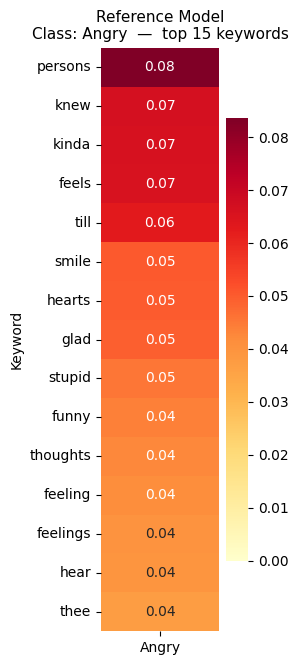

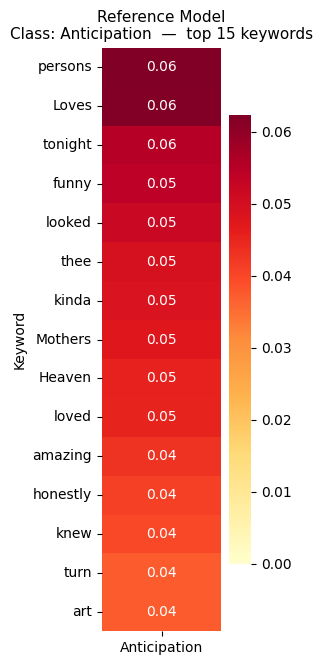

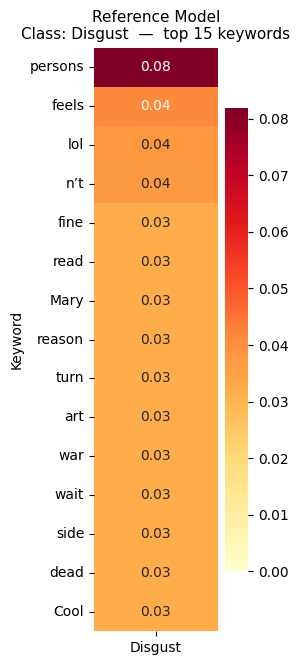

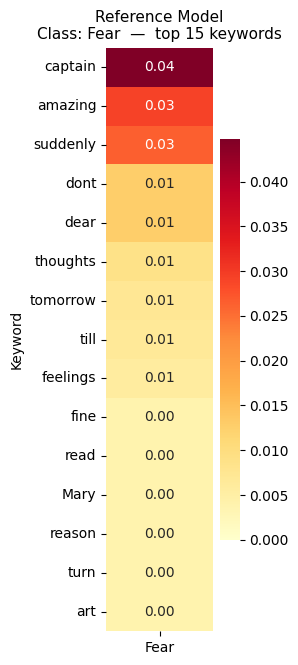

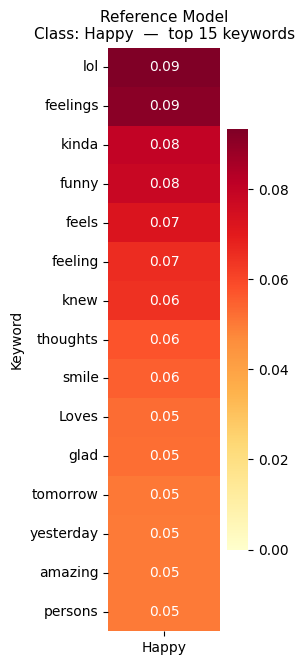

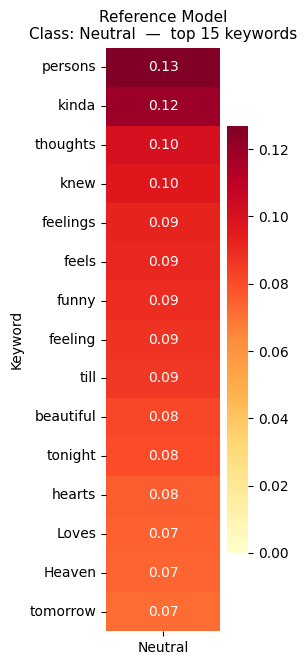

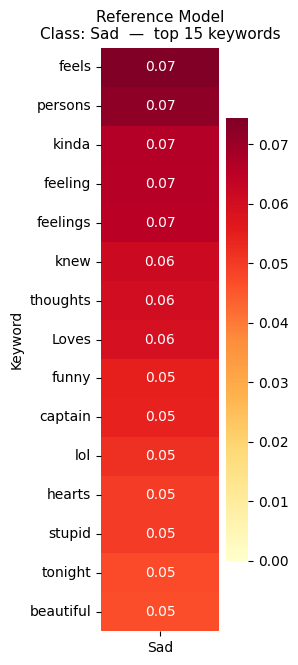

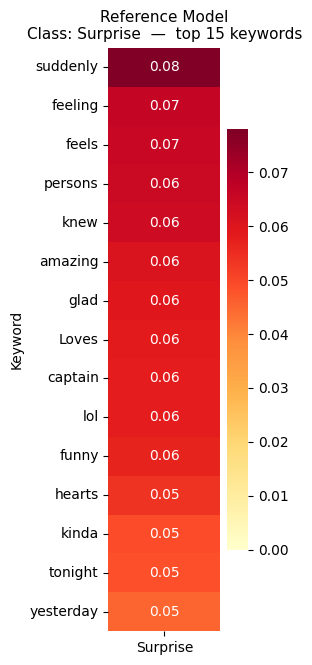

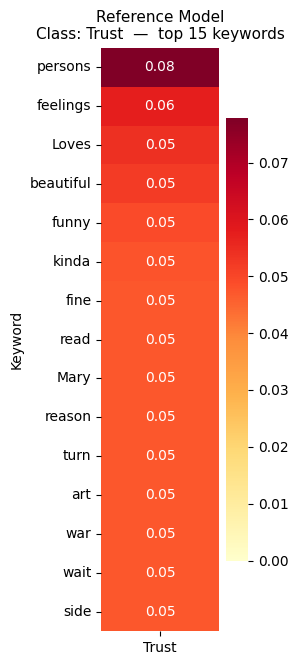

In [49]:
# Step 4 - Visualize BEE Results
visualize_bee_results(bee_results, ID2LABEL, title_prefix="Reference Model")

In [ ]:
# Step 3b - Calculate PCB (Pearson Correlation Bias) for Reference Model
pcb_results, pcb_sorted_sc, pcb_raw_corrs = compute_pcb_scores(
    classifier_weights_norm, keyword_embeddings_norm, clean_keywords, ID2LABEL
)

print("--- Top Potential Spurious Correlations (PCB) ---")
display(pcb_results)

In [ ]:
# Step 4b - Visualize PCB Results (Reference Model)
visualize_bee_results(pcb_results, ID2LABEL, title_prefix="PCB — Reference Model")

In [52]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
print(bee_results)

       Keyword  Bias_Score     Angry  Anticipation   Disgust      Fear  \
0      persons    0.126841  0.083546      0.062309  0.081945  0.000000   
1        kinda    0.119067  0.066184      0.048797  0.008598  0.000000   
2     thoughts    0.100121  0.042557      0.022874  0.000000  0.008789   
3         knew    0.096799  0.066854      0.039833  0.030487  0.000000   
4          lol    0.093258  0.027583      0.013352  0.038103  0.000000   
5     feelings    0.092277  0.040033      0.033630  0.000000  0.005888   
6        feels    0.090871  0.065856      0.025433  0.041458  0.000000   
7        funny    0.089646  0.043833      0.054141  0.019220  0.000000   
8      feeling    0.087395  0.041489      0.027412  0.023370  0.000000   
9         till    0.085747  0.062767      0.029028  0.032199  0.006668   
10   beautiful    0.081324  0.021425      0.034988  0.024148  0.000000   
11     tonight    0.080032  0.032132      0.055452  0.019366  0.000000   
12    suddenly    0.077960  0.034222  

In [53]:
# Show Top Keywords per Emotion
for label in LABEL_NAMES:
    print(f"\n=== Top Keywords for: {label} ===")

    top_for_label = bee_results.sort_values(by=label, ascending=False)

    print(top_for_label[['Keyword', label]].to_string(index=False))


=== Top Keywords for: Angry ===
  Keyword    Angry
  persons 0.083546
     knew 0.066854
    kinda 0.066184
    feels 0.065856
     till 0.062767
    smile 0.050308
   hearts 0.050080
     glad 0.049376
   stupid 0.045653
    funny 0.043833
 thoughts 0.042557
  feeling 0.041489
 feelings 0.040033
     hear 0.039728
     thee 0.037444
  captain 0.035027
      sir 0.034412
 suddenly 0.034222
      wow 0.033493
yesterday 0.032540
     yeah 0.032474
  tonight 0.032132
   sister 0.032066
     soul 0.032066
 tomorrow 0.031815
  finally 0.031795
    Loves 0.030541
     hate 0.030367
     holy 0.030367
     haha 0.030367
    loved 0.028743
     eyes 0.028299
     gods 0.027853
      lol 0.027583
     dear 0.026383
     dont 0.026383
 honestly 0.025944
    cried 0.024710
   looked 0.023606
  totally 0.021661
beautiful 0.021425
      n’t 0.021280
     gave 0.019830
   Heaven 0.015760
     Thou 0.014717
  amazing 0.014090
  Mothers 0.006163
    party 0.000000
   Christ 0.000000
     city 0.00000

Now the finetuned model (target model)

In [54]:
import zipfile
import os

target_zip = "Target_Victim_Model.zip"
target_folder = "./restored_target_model"

def unzip_model(zip_path, extract_to):
    if not os.path.exists(zip_path):
        return False
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    return True

if not unzip_model(target_zip, target_folder):
    raise FileNotFoundError("Target model zip not found.")

!pip install -q yake nltk

In [55]:
import torch
import pandas as pd
import numpy as np
import yake
import nltk
from tqdm import tqdm
from nltk.corpus import stopwords
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from torch.utils.data import DataLoader
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [32]:
tokenizer = AutoTokenizer.from_pretrained(target_folder)
model = AutoModelForSequenceClassification.from_pretrained(target_folder)
model.to("cuda")
model.eval()

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification(
  (gpt_neox): GPTNeoXModel(
    (embed_in): Embedding(50304, 128)
    (emb_dropout): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-5): 6 x GPTNeoXLayer(
        (input_layernorm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (post_attention_layernorm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (post_attention_dropout): Dropout(p=0.0, inplace=False)
        (post_mlp_dropout): Dropout(p=0.0, inplace=False)
        (attention): GPTNeoXAttention(
          (query_key_value): Linear(in_features=128, out_features=384, bias=True)
          (dense): Linear(in_features=128, out_features=128, bias=True)
        )
        (mlp): GPTNeoXMLP(
          (dense_h_to_4h): Linear(in_features=128, out_features=512, bias=True)
          (dense_4h_to_h): Linear(in_features=512, out_features=128, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (final_layer_norm): LayerNorm((128,), eps=1e-05, 

In [33]:
ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())

def normalize_embeddings(embeddings):
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def extract_keywords_from_text(texts, top=50):
    text_combined = " ".join([str(t) for t in texts])

    kw_extractor = yake.KeywordExtractor(
        lan="en",
        n=1,
        dedupLim=0.9,
        top=top,
        features=None
    )
    keywords = kw_extractor.extract_keywords(text_combined)
    return [k[0] for k in keywords]

In [34]:
if not os.path.exists("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"):
    raise FileNotFoundError("all_4_datasets.csv not found.")

df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)

le = LabelEncoder()
df['label_id'] = le.fit_transform(df['label'])

dataset = Dataset.from_pandas(df[['text', 'label_id']].rename(columns={'label_id': 'labels'}))
# No train/test split — use all data

def tokenize_function(examples):
    return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

tokenized_datasets = dataset.map(tokenize_function, batched=True)
tokenized_datasets.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])

Map:   0%|          | 0/427290 [00:00<?, ? examples/s]

In [35]:
def get_embeddings(model, tokenizer, dataset, batch_size=32):
    dataloader = DataLoader(dataset, batch_size=batch_size)
    embeddings = []
    labels = []

    with torch.no_grad():
        for batch in tqdm(dataloader):
            input_ids = batch['input_ids'].to("cuda")
            attention_mask = batch['attention_mask'].to("cuda")
            batch_labels = batch['labels'].numpy()

            outputs = model(input_ids=input_ids, attention_mask=attention_mask, output_hidden_states=True)
            last_hidden_state = outputs.hidden_states[-1]

            seq_lengths = attention_mask.sum(dim=1) - 1
            batch_indices = torch.arange(last_hidden_state.size(0)).to("cuda")
            batch_embeddings = last_hidden_state[batch_indices, seq_lengths]

            embeddings.append(batch_embeddings.cpu().numpy())
            labels.append(batch_labels)

    return np.concatenate(embeddings), np.concatenate(labels)

print("Embedding extraction skipped — embeddings are not used in BEE score computation.")

Embedding extraction skipped — embeddings are not used in BEE score computation.


In [36]:
classifier_weights = model.score.weight.detach().cpu().numpy()
classifier_weights_norm = normalize_embeddings(classifier_weights)

In [37]:
import torch
import numpy as np
from transformers import AutoTokenizer

# 1. Identify and Reload the Tokenizer from the source
model_name = model.config._name_or_path
print(f"Reloading fresh tokenizer for: {model_name}")

tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=False)

# 2. Hard-reset the configuration
tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "left"
tokenizer.model_max_length = 2048

# 3. VERIFICATION TEST
test_ids = tokenizer.encode("feel")
print(f"Verification - Tokens for 'feel': {test_ids}")

if not test_ids:
    # If it still fails, we force a generic GPT-NeoX tokenizer as a last resort
    print("Standard load failed. Forcing Pythia-14m tokenizer as fallback...")
    tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pythia-14m")
    tokenizer.pad_token = tokenizer.eos_token
    test_ids = tokenizer.encode("feel")
    print(f"Fallback Verification - Tokens for 'feel': {test_ids}")

all_texts = df['text'].tolist()
raw_keywords = extract_keywords_from_text(all_texts, top=200)

filter_words = set([w.lower() for w in LABEL_NAMES])
clean_keywords = [str(k).strip() for k in raw_keywords if str(k).lower() not in filter_words and len(str(k).strip()) > 0]

def embed_text_list(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i : i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt").to("cuda")

        if inputs.input_ids.shape[1] == 0:
            continue

        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs.attention_mask
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[torch.arange(last_hidden.size(0)), seq_lens]
            all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)

keyword_embeddings = embed_text_list(clean_keywords, model, tokenizer, batch_size=64)
keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)
print(f"Success! Final shape: {keyword_embeddings_norm.shape}")

Reloading fresh tokenizer for: ./restored_target_model
Verification - Tokens for 'feel': [39336]
Success! Final shape: (197, 128)


In [56]:
bee_results, sorted_sc, raw_sims = compute_bee_scores(
    classifier_weights_norm, keyword_embeddings_norm, clean_keywords, ID2LABEL
)

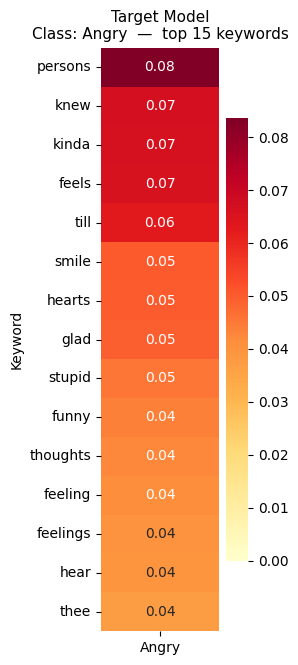

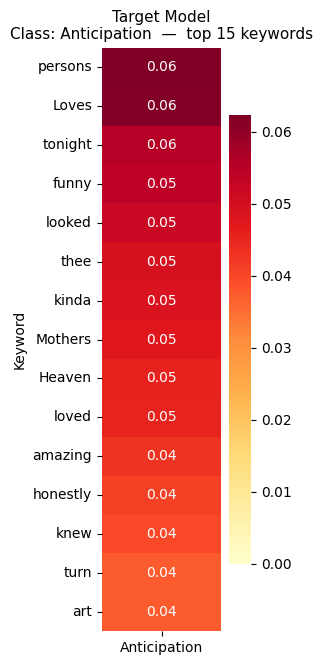

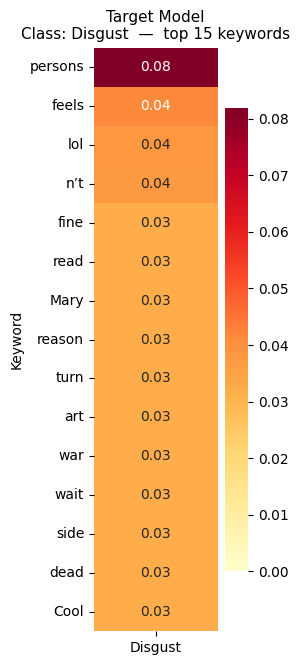

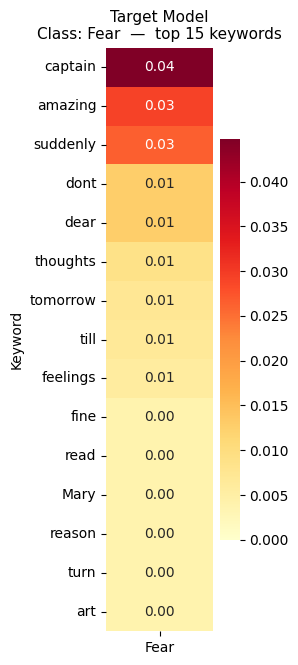

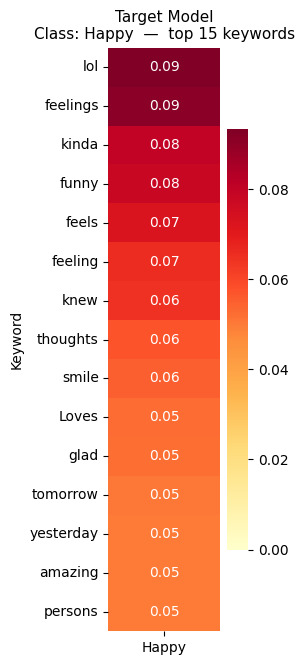

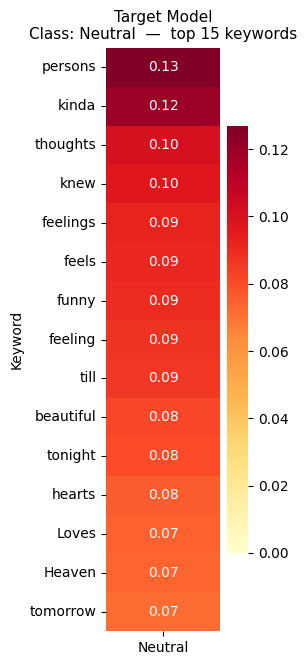

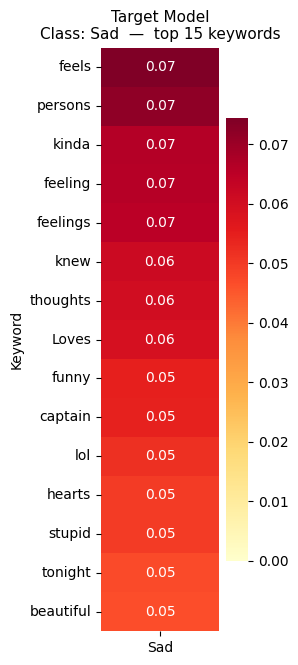

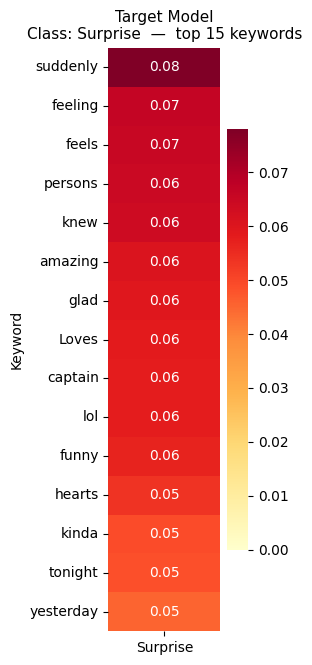

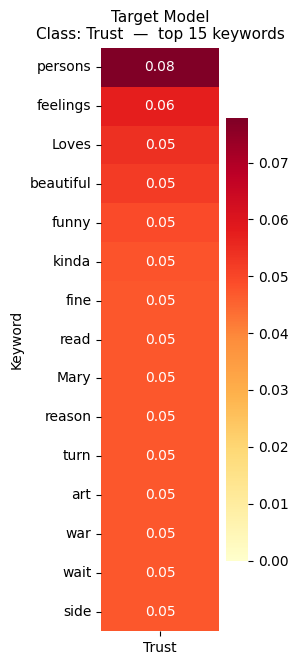

In [57]:
visualize_bee_results(bee_results, ID2LABEL, title_prefix="Target Model")

In [ ]:
# PCB (Pearson Correlation Bias) for Target Model
pcb_results_target, pcb_sorted_sc_target, pcb_raw_corrs_target = compute_pcb_scores(
    classifier_weights_norm, keyword_embeddings_norm, clean_keywords, ID2LABEL
)

print("--- Top Potential Spurious Correlations (PCB) — Target Model ---")
display(pcb_results_target)

In [ ]:
# Visualize PCB Results (Target Model)
visualize_bee_results(pcb_results_target, ID2LABEL, title_prefix="PCB — Target Model")

In [58]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

for label in LABEL_NAMES:
    print(f"\n=== Top Keywords for: {label} (Target Model) ===")
    top_for_label = bee_results.sort_values(by=label, ascending=False)
    print(top_for_label[['Keyword', label]].to_string(index=False))


=== Top Keywords for: Angry (Target Model) ===
  Keyword    Angry
  persons 0.083546
     knew 0.066854
    kinda 0.066184
    feels 0.065856
     till 0.062767
    smile 0.050308
   hearts 0.050080
     glad 0.049376
   stupid 0.045653
    funny 0.043833
 thoughts 0.042557
  feeling 0.041489
 feelings 0.040033
     hear 0.039728
     thee 0.037444
  captain 0.035027
      sir 0.034412
 suddenly 0.034222
      wow 0.033493
yesterday 0.032540
     yeah 0.032474
  tonight 0.032132
   sister 0.032066
     soul 0.032066
 tomorrow 0.031815
  finally 0.031795
    Loves 0.030541
     hate 0.030367
     holy 0.030367
     haha 0.030367
    loved 0.028743
     eyes 0.028299
     gods 0.027853
      lol 0.027583
     dear 0.026383
     dont 0.026383
 honestly 0.025944
    cried 0.024710
   looked 0.023606
  totally 0.021661
beautiful 0.021425
      n’t 0.021280
     gave 0.019830
   Heaven 0.015760
     Thou 0.014717
  amazing 0.014090
  Mothers 0.006163
    party 0.000000
   Christ 0.000000
  

---
# N-1 and Single-Dataset BEE Diagnostic Analysis

Train 8 additional classifiers (4 leave-one-out + 4 individual datasets) and compute BEE scores for each. Then build a diagnostic matrix comparing individual dataset fingerprints to their leave-one-out contributions.

In [41]:
# ============================================================================
# CONFIGURATION: Dataset paths and model save paths
# ============================================================================
import gc

FULL_DATASET_PATH = "/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"

DATASET_CONFIGS = {
    # Leave-one-out (n-1) combinations
    "n-1_no_EmoLit":       "no_EmoLit.csv",
    "n-1_no_Emotion20":    "no_EmotionDataset20.csv",
    "n-1_no_GoEmotions":   "no_GoEmotions.csv",
    "n-1_no_XED_SMED":     "no_XED_SMED.csv",
    # Individual datasets
    "single_EmoLit":       "EmoLit_mapped.csv",
    "single_Emotion20":    "EmotionDataset20_mapped.csv",
    "single_GoEmotions":   "GoEmotions_mapped.csv",
    "single_XED_SMED":     "XED_and_SMED.csv",
}

MODEL_ID = "EleutherAI/pythia-14m"

# Dictionary to store all BEE results for diagnostic analysis
# Each entry: {"bee_df": DataFrame, "similarities": np.array, "keywords": list}
all_bee_results = {}

# Store the full-dataset (alpha_n) results from earlier analysis
# The bee_results DataFrame from Cell 42 (target model) is our alpha_n
# We need to also save the raw similarity matrix and keyword list
print("Configuration loaded. Ready to train 8 classifiers.")
print(f"\nDataset configs:")
for name, path in DATASET_CONFIGS.items():
    print(f"  {name}: {path}")

Configuration loaded. Ready to train 8 classifiers.

Dataset configs:
  n-1_no_EmoLit: no_EmoLit.csv
  n-1_no_Emotion20: no_EmotionDataset20.csv
  n-1_no_GoEmotions: no_GoEmotions.csv
  n-1_no_XED_SMED: no_XED_SMED.csv
  single_EmoLit: EmoLit_mapped.csv
  single_Emotion20: EmotionDataset20_mapped.csv
  single_GoEmotions: GoEmotions_mapped.csv
  single_XED_SMED: XED_and_SMED.csv


In [42]:
# ============================================================================
# Save alpha_n (full dataset BEE results) from the target model analysis above
# ============================================================================
# bee_results from Cell 42 is the target model BEE DataFrame
# We need the similarity matrix and keywords

# Reconstruct from bee_results (which was computed in Cells 40-42)
alpha_n_keywords = bee_results['Keyword'].tolist()
alpha_n_sims = bee_results[list(ID2LABEL.values())].values  # shape: (num_keywords, 9)

all_bee_results["alpha_n"] = {
    "bee_df": bee_results.copy(),
    "similarities": alpha_n_sims,
    "keywords": alpha_n_keywords,
}

print(f"Saved alpha_n: {len(alpha_n_keywords)} keywords, shape {alpha_n_sims.shape}")

Saved alpha_n: 197 keywords, shape (197, 9)


In [43]:
# ============================================================================
# REUSABLE PIPELINE: Train CLM + Classification Head + BEE
# ============================================================================
import torch.nn as nn
from transformers import (
    AutoTokenizer, AutoModelForCausalLM, AutoModelForSequenceClassification,
    TrainingArguments, Trainer, DataCollatorForLanguageModeling, DataCollatorWithPadding
)
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, f1_score

class WeightedTrainer(Trainer):
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights

    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")
        if self.class_weights is not None:
            loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        else:
            loss_fct = nn.CrossEntropyLoss()
        loss = loss_fct(logits.view(-1, self.model.config.num_labels), labels.view(-1))
        return (loss, outputs) if return_outputs else loss


def full_bee_pipeline(config_name, dataset_path, model_id=MODEL_ID):
    """
    Full pipeline: Load data -> Train CLM -> Train Classifier -> Compute BEE.
    Returns bee_df, similarity_matrix, keyword_list.
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # --- 1. Load data ---
    print(f"\n{'='*80}")
    print(f"PIPELINE: {config_name}")
    print(f"{'='*80}")

    df = pd.read_csv(dataset_path)
    df = df.dropna(subset=['text', 'label'])
    df['text'] = df['text'].astype(str)
    print(f"Loaded {len(df):,} samples from {dataset_path}")
    print(f"Label distribution:\n{df['label'].value_counts()}")

    # Encode labels
    le = LabelEncoder()
    df['label_id'] = le.fit_transform(df['label'])
    id2label = {idx: label for idx, label in enumerate(le.classes_)}
    label2id = {v: k for k, v in id2label.items()}
    num_labels = len(id2label)

    # --- 2. Train CLM (Causal Language Model) ---
    print(f"\n--- Training CLM for {config_name} ---")
    tokenizer = AutoTokenizer.from_pretrained(model_id)
    tokenizer.pad_token = tokenizer.eos_token

    clm_model = AutoModelForCausalLM.from_pretrained(model_id, torch_dtype=torch.float32)
    clm_model.to(device)

    # Tokenize for CLM (text only, no labels)
    clm_dataset = Dataset.from_pandas(df[['text']])

    def tokenize_clm(examples):
        return tokenizer(examples['text'], truncation=True, max_length=128)

    tok_clm = clm_dataset.map(tokenize_clm, batched=True, remove_columns=['text'])
    # No eval split — train on all data for maximum BEE signal

    clm_collator = DataCollatorForLanguageModeling(tokenizer=tokenizer, mlm=False)

    clm_save_path = f"./clm_{config_name}"
    clm_args = TrainingArguments(
        output_dir=clm_save_path,
        num_train_epochs=3,
        per_device_train_batch_size=32,
        learning_rate=2e-5,
        seed=SEED,
        data_seed=SEED,
        weight_decay=0.01,

        logging_steps=100,
        report_to="none",
        save_strategy="no",
    )

    clm_trainer = Trainer(
        model=clm_model,
        args=clm_args,
        train_dataset=tok_clm,
        data_collator=clm_collator,
    )
    clm_trainer.train()
    clm_trainer.save_model(clm_save_path)
    tokenizer.save_pretrained(clm_save_path)

    # Free CLM model memory
    del clm_model, clm_trainer
    gc.collect()
    torch.cuda.empty_cache()

    # --- 3. Train Classification Head ---
    print(f"\n--- Training Classification Head for {config_name} ---")

    # Class weights for imbalanced data
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(df['label']),
        y=df['label']
    )
    class_weights_tensor = torch.FloatTensor(class_weights).to(device)

    clf_model = AutoModelForSequenceClassification.from_pretrained(
        clm_save_path,
        num_labels=num_labels,
        id2label=id2label,
        label2id=label2id,
        torch_dtype=torch.float32,
        ignore_mismatched_sizes=True,
    )
    clf_model.config.pad_token_id = tokenizer.pad_token_id
    clf_model.to(device)

    # Tokenize for classification (with labels)
    clf_dataset = Dataset.from_pandas(
        df[['text', 'label_id']].rename(columns={'label_id': 'labels'})
    )

    def tokenize_clf(examples):
        return tokenizer(examples['text'], truncation=True, max_length=128)

    tok_clf = clf_dataset.map(tokenize_clf, batched=True)
    tok_clf.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])
    # No eval split — train on all data

    clf_collator = DataCollatorWithPadding(tokenizer=tokenizer)

    def compute_metrics(eval_pred):
        logits, labels = eval_pred
        preds = np.argmax(logits, axis=-1)
        return {
            "accuracy": accuracy_score(labels, preds),
            "f1": f1_score(labels, preds, average="weighted"),
        }

    clf_save_path = f"./clf_{config_name}"
    clf_args = TrainingArguments(
        output_dir=clf_save_path,
        num_train_epochs=3,
        per_device_train_batch_size=32,
        learning_rate=2e-5,
        logging_steps=100,
        report_to="none",
        seed=SEED,
        data_seed=SEED,
        save_strategy="no",
    )

    clf_trainer = WeightedTrainer(
        model=clf_model,
        args=clf_args,
        train_dataset=tok_clf,
        data_collator=clf_collator,
        class_weights=class_weights_tensor,
    )
    clf_trainer.train()
    clf_trainer.save_model(clf_save_path)
    tokenizer.save_pretrained(clf_save_path)

    # --- 4. BEE Analysis ---
    print(f"\n--- BEE Analysis for {config_name} ---")

    # Extract classifier weights
    classifier_weights = clf_model.score.weight.detach().cpu().numpy()
    classifier_weights_norm = normalize_embeddings(classifier_weights)

    # Extract keywords from THIS dataset's texts
    all_texts = df['text'].tolist()
    raw_keywords = extract_keywords_from_text(all_texts, top=200)
    filter_words = set([w.lower() for w in LABEL_NAMES])
    clean_keywords = [str(k).strip() for k in raw_keywords
                      if str(k).lower() not in filter_words and len(str(k).strip()) > 0]

    # Embed keywords using the classifier model
    clf_model.eval()
    keyword_embeddings = embed_text_list(clean_keywords, clf_model, tokenizer)
    keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)

    # Compute BEE scores
    bee_df, sorted_sc, raw_sims = compute_bee_scores(
        classifier_weights_norm, keyword_embeddings_norm, clean_keywords, id2label
    )

    # Store results
    result = {
        "bee_df": bee_df,
        "pcb_df": pcb_df,
        "similarities": sorted_sc,
        "keywords": bee_df['Keyword'].tolist(),
    }

    # Visualize BEE
    visualize_bee_results(bee_df, id2label, title_prefix=config_name, top_k=15)

    # Compute PCB scores
    pcb_df, pcb_sorted_sc, pcb_raw_corrs = compute_pcb_scores(
        classifier_weights_norm, keyword_embeddings_norm, clean_keywords, id2label
    )
    visualize_bee_results(pcb_df, id2label, title_prefix=f"PCB — {config_name}", top_k=15)

    # Free memory
    del clf_model, clf_trainer
    gc.collect()
    torch.cuda.empty_cache()

    print(f"\nDone: {config_name} — {len(clean_keywords)} keywords, BEE shape {sorted_sc.T.shape}")
    return result

print("Pipeline function defined.")

Pipeline function defined.


In [44]:
# Override embed_text_list with batched version for large keyword sets
def embed_text_list(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i : i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt")
        inputs = {k: v.to(model.device) for k, v in inputs.items()}

        if inputs['input_ids'].shape[1] == 0:
            continue

        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs['attention_mask']
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[torch.arange(last_hidden.size(0), device=last_hidden.device), seq_lens]
            all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)

print("Batched embed_text_list defined.")

Batched embed_text_list defined.


---
## N-1: All except EmoLit


PIPELINE: n-1_no_EmoLit
Loaded 226,563 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_EmoLit.csv
Label distribution:
label
Happy           58894
Neutral         42908
Sad             40372
Angry           28859
Trust           14525
Anticipation    14358
Surprise        11687
Disgust          8804
Fear             6156
Name: count, dtype: int64

--- Training CLM for n-1_no_EmoLit ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/226563 [00:00<?, ? examples/s]

Step,Training Loss
100,5.064835
200,4.953672
300,4.871535
400,4.768438
500,4.745157
600,4.740517
700,4.704523
800,4.665592
900,4.607245
1000,4.620154


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_EmoLit ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_EmoLit
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/226563 [00:00<?, ? examples/s]

Step,Training Loss
100,4.122629
200,2.025206
300,1.806288
400,1.620842
500,1.582524
600,1.481584
700,1.421009
800,1.367856
900,1.339761
1000,1.292736


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_EmoLit ---


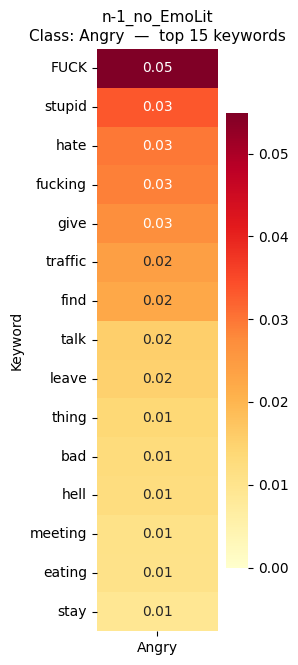

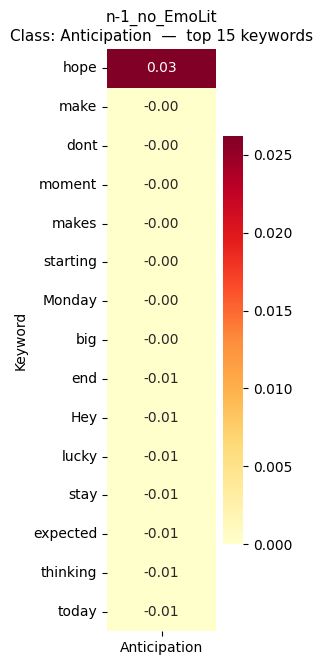

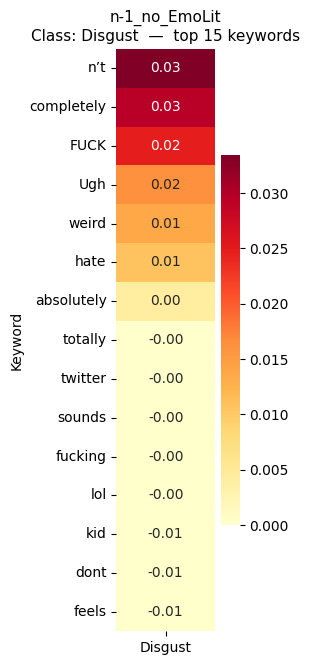

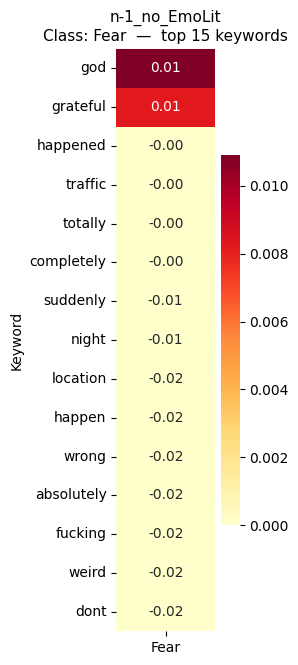

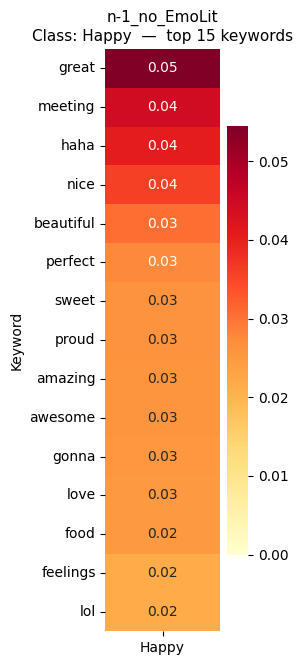

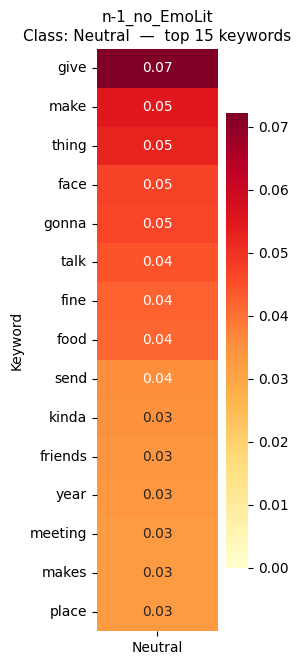

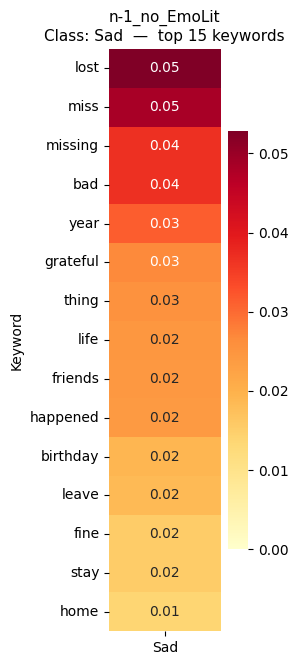

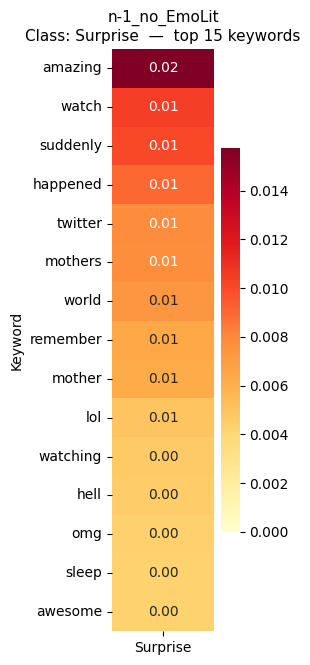

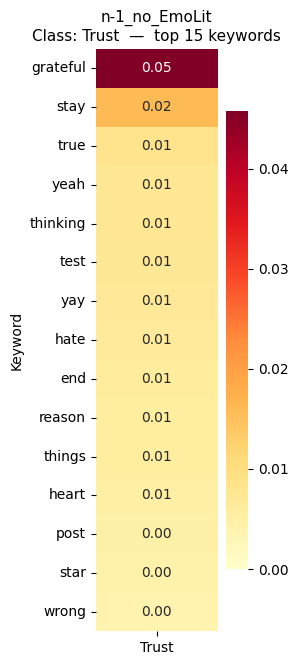


Done: n-1_no_EmoLit — 196 keywords, BEE shape (196, 9)


In [45]:
all_bee_results["n-1_no_EmoLit"] = full_bee_pipeline(
    "n-1_no_EmoLit",
    "/content/drive/MyDrive/UPDATED_DATASETS/no_EmoLit.csv"
    # DATASET_CONFIGS["n-1_no_EmoLit"],
)

---
## N-1: All except EmotionDataset20


PIPELINE: n-1_no_Emotion20
Loaded 347,695 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_EmotionDataset20.csv
Label distribution:
label
Happy           79327
Sad             60987
Neutral         59520
Angry           35532
Anticipation    34811
Trust           34284
Fear            15803
Surprise        13782
Disgust         13649
Name: count, dtype: int64

--- Training CLM for n-1_no_Emotion20 ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/347695 [00:00<?, ? examples/s]

Step,Training Loss
100,5.201588
200,5.125149
300,5.061087
400,5.031528
500,5.012878
600,4.990703
700,4.971269
800,4.926968
900,4.932283
1000,4.956079


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_Emotion20 ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_Emotion20
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/347695 [00:00<?, ? examples/s]

Step,Training Loss
100,3.840355
200,2.122506
300,2.043673
400,1.920351
500,1.819060
600,1.739751
700,1.701098
800,1.690620
900,1.661100
1000,1.597967


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_Emotion20 ---


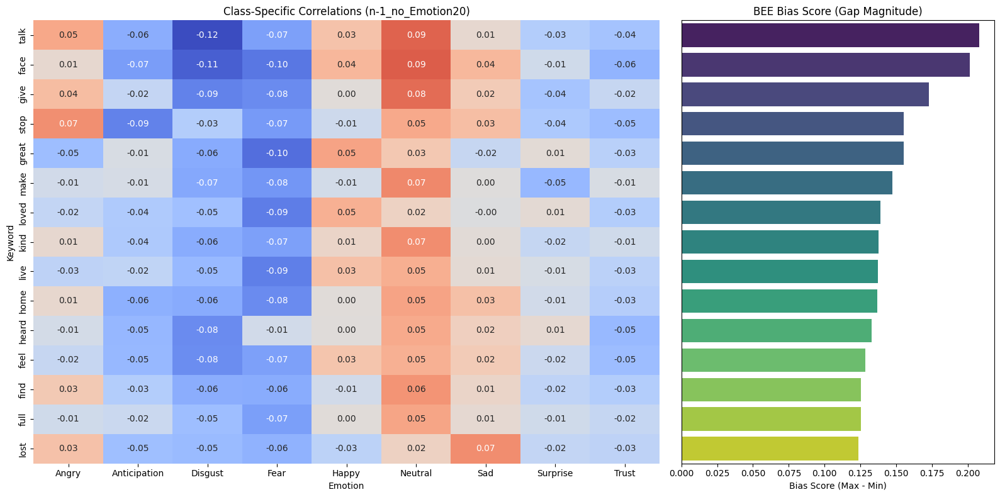


Done: n-1_no_Emotion20 — 197 keywords, BEE shape (197, 9)


In [48]:
all_bee_results["n-1_no_Emotion20"] = full_bee_pipeline(
    "n-1_no_Emotion20",
    "/content/drive/MyDrive/UPDATED_DATASETS/no_EmotionDataset20.csv"
)

---
## N-1: All except GoEmotions


PIPELINE: n-1_no_GoEmotions
Loaded 373,300 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_GoEmotions.csv
Label distribution:
label
Happy           83873
Sad             76654
Neutral         46978
Angry           42170
Anticipation    38251
Trust           37183
Fear            18592
Disgust         15115
Surprise        14484
Name: count, dtype: int64

--- Training CLM for n-1_no_GoEmotions ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/373300 [00:00<?, ? examples/s]

Step,Training Loss
100,5.154319
200,5.067471
300,5.010555
400,4.944464
500,4.904209
600,4.917836
700,4.891965
800,4.849474
900,4.844350
1000,4.849429


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_GoEmotions ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_GoEmotions
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/373300 [00:00<?, ? examples/s]

Step,Training Loss
100,3.919314
200,2.092751
300,1.932202
400,1.809396
500,1.639403
600,1.624319
700,1.524848
800,1.514497
900,1.488180
1000,1.462149


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_GoEmotions ---


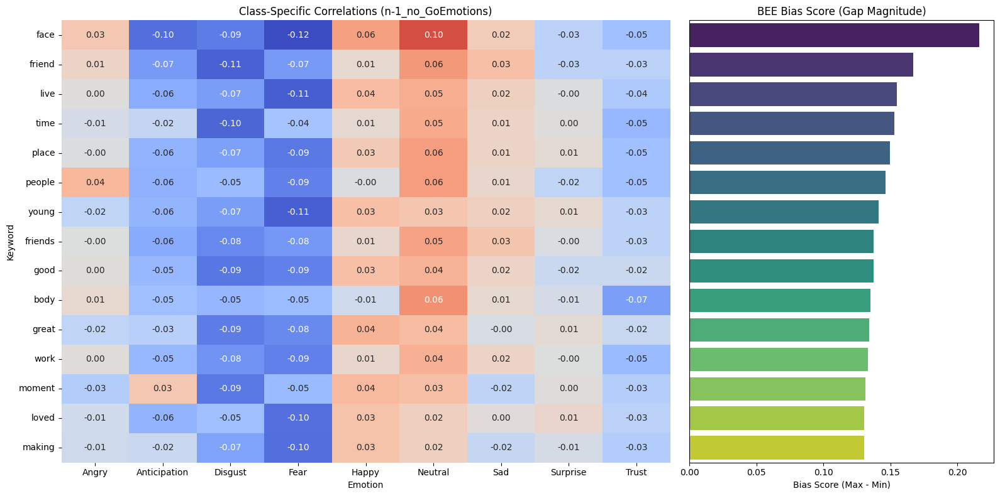


Done: n-1_no_GoEmotions — 197 keywords, BEE shape (197, 9)


In [49]:
all_bee_results["n-1_no_GoEmotions"] = full_bee_pipeline(
    "n-1_no_GoEmotions",
   "/content/drive/MyDrive/UPDATED_DATASETS/no_GoEmotions.csv",
)

---
## N-1: All except XED & SMED


PIPELINE: n-1_no_XED_SMED
Loaded 334,315 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_XED_SMED.csv
Label distribution:
label
Happy           73415
Sad             61621
Anticipation    39651
Neutral         39441
Trust           38968
Angry           33735
Fear            17581
Disgust         16324
Surprise        13579
Name: count, dtype: int64

--- Training CLM for n-1_no_XED_SMED ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/334315 [00:00<?, ? examples/s]

Step,Training Loss
100,5.001070
200,4.954008
300,4.890011
400,4.868235
500,4.844498
600,4.806575
700,4.838358
800,4.767615
900,4.780340
1000,4.768448


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_XED_SMED ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_XED_SMED
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/334315 [00:00<?, ? examples/s]

Step,Training Loss
100,3.894795
200,2.208405
300,2.099778
400,1.893066
500,1.800187
600,1.741745
700,1.650728
800,1.593396
900,1.575610
1000,1.510228


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_XED_SMED ---


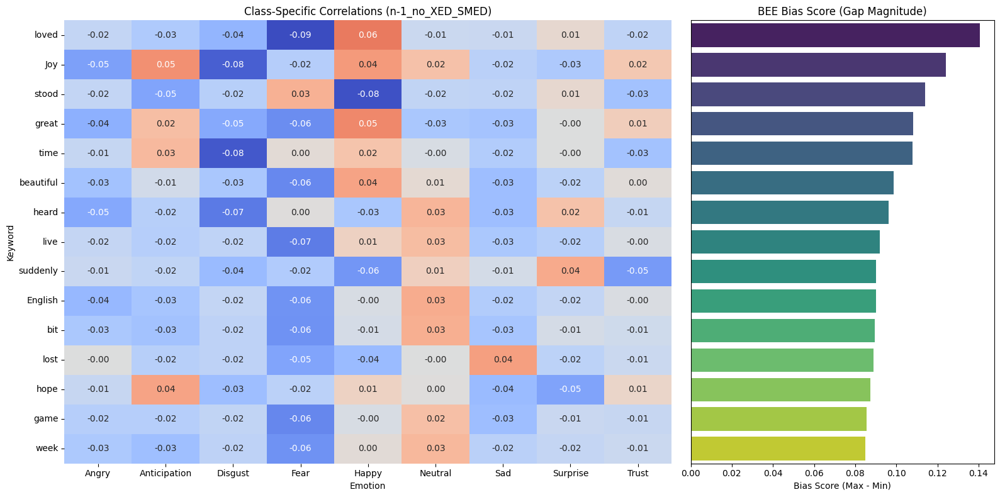


Done: n-1_no_XED_SMED — 197 keywords, BEE shape (197, 9)


In [50]:
all_bee_results["n-1_no_XED_SMED"] = full_bee_pipeline(
    "n-1_no_XED_SMED",
    "/content/drive/MyDrive/UPDATED_DATASETS/no_XED_SMED.csv",
)

---
## Single Dataset: EmoLit


PIPELINE: single_EmoLit
Loaded 200,727 samples from /content/drive/MyDrive/UPDATED_DATASETS/EmoLit_mapped.csv
Label distribution:
label
Happy           39609
Sad             39506
Anticipation    27999
Trust           27128
Neutral         20041
Angry           17906
Fear            13221
Disgust          9160
Surprise         6157
Name: count, dtype: int64

--- Training CLM for single_EmoLit ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/200727 [00:00<?, ? examples/s]

Step,Training Loss
100,5.027694
200,4.962646
300,4.911164
400,4.868336
500,4.859497
600,4.803557
700,4.837603
800,4.791989
900,4.784121
1000,4.802968


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_EmoLit ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_EmoLit
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/200727 [00:00<?, ? examples/s]

Step,Training Loss
100,3.686828
200,2.175664
300,2.010464
400,1.852680
500,1.681258
600,1.626582
700,1.549108
800,1.605854
900,1.582845
1000,1.565786


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_EmoLit ---


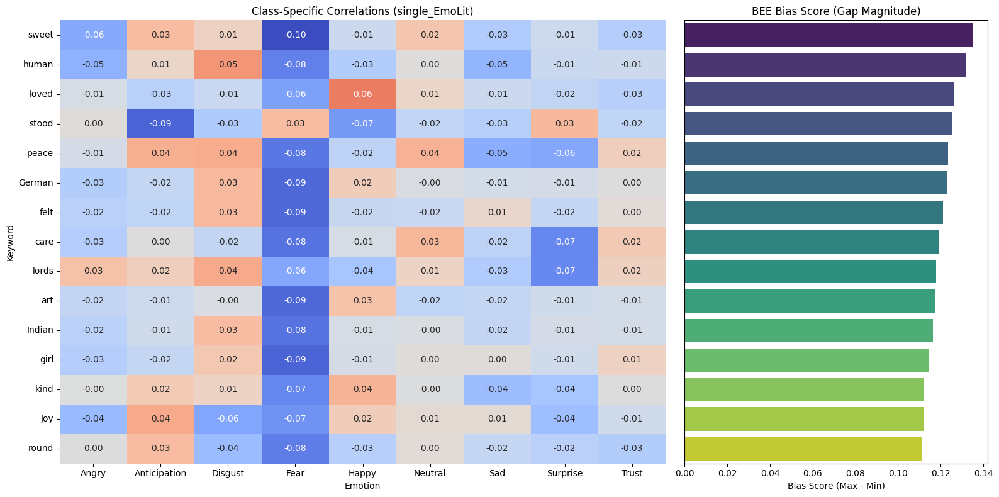


Done: single_EmoLit — 198 keywords, BEE shape (198, 9)


In [51]:
all_bee_results["single_EmoLit"] = full_bee_pipeline(
    "single_EmoLit",
    "/content/drive/MyDrive/UPDATED_DATASETS/EmoLit_mapped.csv",
)

---
## Single Dataset: EmotionDataset20


PIPELINE: single_Emotion20
Loaded 79,595 samples from /content/drive/MyDrive/UPDATED_DATASETS/EmotionDataset20_mapped.csv
Label distribution:
label
Happy           19176
Sad             18891
Angry           11233
Anticipation     7546
Trust            7369
Disgust          4315
Surprise         4062
Fear             3574
Neutral          3429
Name: count, dtype: int64

--- Training CLM for single_Emotion20 ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/79595 [00:00<?, ? examples/s]

Step,Training Loss
100,3.797283
200,3.407325
300,3.252329
400,3.101442
500,3.052724
600,3.032600
700,2.925518
800,2.896914
900,2.850924
1000,2.814169


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_Emotion20 ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_Emotion20
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/79595 [00:00<?, ? examples/s]

Step,Training Loss
100,3.346958
200,1.371328
300,1.090391
400,0.884602
500,0.810798
600,0.709935
700,0.727593
800,0.614934
900,0.552600
1000,0.577278


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_Emotion20 ---


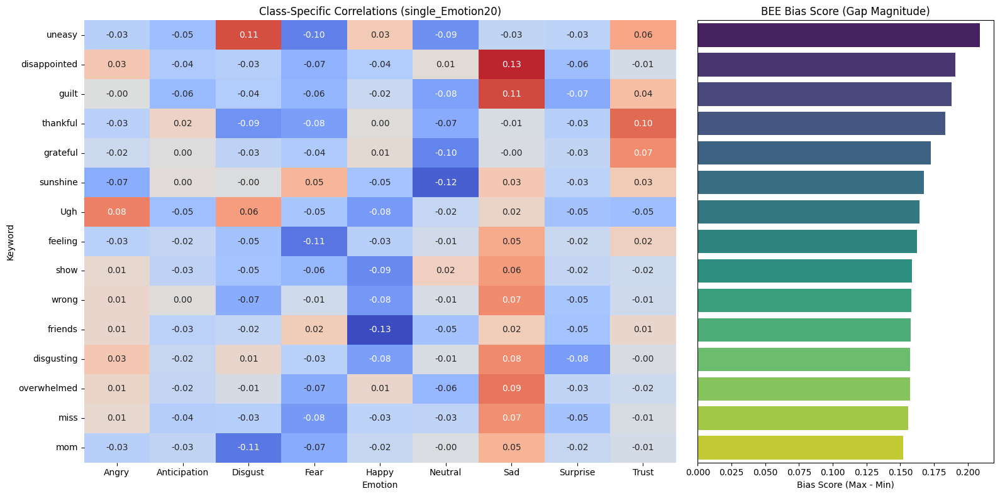


Done: single_Emotion20 — 198 keywords, BEE shape (198, 9)


In [52]:
all_bee_results["single_Emotion20"] = full_bee_pipeline(
    "single_Emotion20",
    "/content/drive/MyDrive/UPDATED_DATASETS/EmotionDataset20_mapped.csv",
)

---
## Single Dataset: GoEmotions


PIPELINE: single_GoEmotions
Loaded 53,993 samples from /content/drive/MyDrive/UPDATED_DATASETS/GoEmotions_mapped.csv
Label distribution:
label
Neutral         15971
Happy           14630
Angry            4596
Trust            4471
Anticipation     4106
Surprise         3360
Sad              3224
Disgust          2849
Fear              786
Name: count, dtype: int64

--- Training CLM for single_GoEmotions ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/53993 [00:00<?, ? examples/s]

Step,Training Loss
100,4.911157
200,4.835191
300,4.829926
400,4.759883
500,4.715291
600,4.723281
700,4.690476
800,4.639172
900,4.648073
1000,4.656754


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_GoEmotions ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_GoEmotions
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/53993 [00:00<?, ? examples/s]

Step,Training Loss
100,3.819328
200,2.226614
300,2.015301
400,1.796954
500,1.803762
600,1.642973
700,1.591837
800,1.603120
900,1.585340
1000,1.528279


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_GoEmotions ---


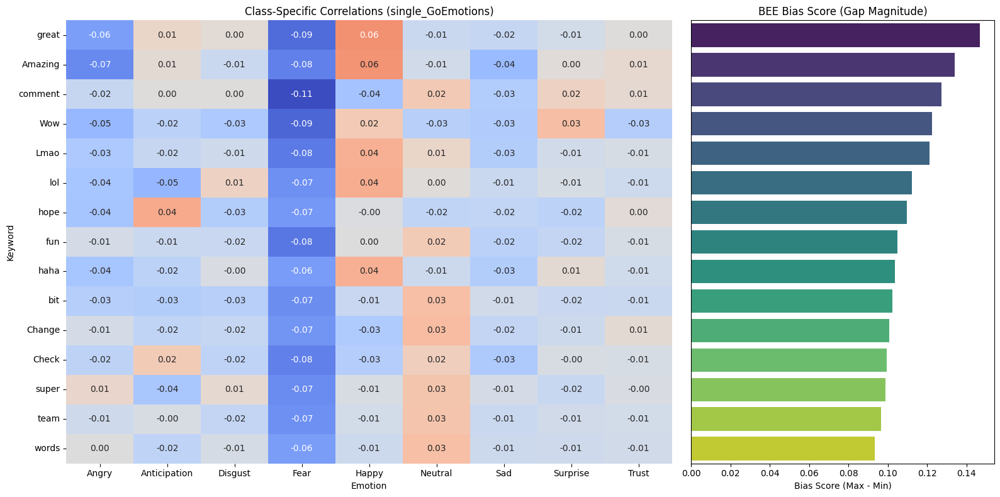


Done: single_GoEmotions — 198 keywords, BEE shape (198, 9)


In [53]:
all_bee_results["single_GoEmotions"] = full_bee_pipeline(
    "single_GoEmotions",
    "/content/drive/MyDrive/UPDATED_DATASETS/GoEmotions_mapped.csv",
)

---
## Single Dataset: XED & SMED


PIPELINE: single_XED_SMED
Loaded 92,978 samples from /content/drive/MyDrive/UPDATED_DATASETS/XED_and_SMED.csv
Label distribution:
label
Happy           25088
Neutral         23508
Sad             18257
Angry           13031
Surprise         4265
Anticipation     2706
Trust            2686
Fear             1797
Disgust          1640
Name: count, dtype: int64

--- Training CLM for single_XED_SMED ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/92978 [00:00<?, ? examples/s]

Step,Training Loss
100,5.365338
200,5.173253
300,5.136712
400,5.044427
500,5.020617
600,4.932012
700,4.926593
800,4.907567
900,4.903328
1000,4.869133


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_XED_SMED ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_XED_SMED
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/92978 [00:00<?, ? examples/s]

Step,Training Loss
100,3.840775
200,1.821482
300,1.625660
400,1.631839
500,1.564490
600,1.462061
700,1.408497
800,1.396917
900,1.373513
1000,1.387663


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_XED_SMED ---


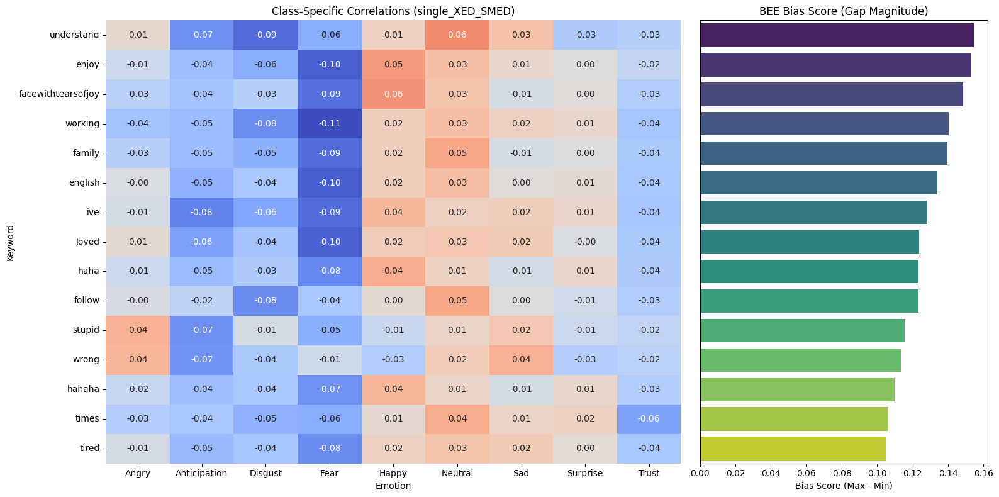


Done: single_XED_SMED — 197 keywords, BEE shape (197, 9)


In [54]:
all_bee_results["single_XED_SMED"] = full_bee_pipeline(
    "single_XED_SMED",
    "/content/drive/MyDrive/UPDATED_DATASETS/XED_and_SMED.csv",
)

---
# Diagnostic Analysis

Compute the diagnostic matrix:
- `a_{n\1,i} = linearize(alpha_n - alpha_{n-1,i})` — what dataset i contributes
- `a_{1,i} = linearize(alpha_{1,i})` — BEE from dataset i alone
- `D[i,j] = cos_sim(a_{1,i}, a_{n\1,j})` — should have largest values on diagonal

In [55]:
# ============================================================================
# Step 1: Align all BEE matrices using union of keywords + zero-fill
# ============================================================================
from sklearn.metrics.pairwise import cosine_similarity as sklearn_cosine_sim

DATASET_NAMES = ["EmoLit", "Emotion20", "GoEmotions", "XED_SMED"]
N1_KEYS = ["n-1_no_EmoLit", "n-1_no_Emotion20", "n-1_no_GoEmotions", "n-1_no_XED_SMED"]
SINGLE_KEYS = ["single_EmoLit", "single_Emotion20", "single_GoEmotions", "single_XED_SMED"]

# The canonical 9-class label order
CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]
canonical_label_to_idx = {label: i for i, label in enumerate(CANONICAL_LABELS)}

# Collect all unique keywords across all results (alpha_n + 8 classifiers)
all_keywords_set = set()
for key, result in all_bee_results.items():
    all_keywords_set.update(result["keywords"])

# Sort for consistent ordering
all_keywords_union = sorted(all_keywords_set)
keyword_to_idx = {kw: i for i, kw in enumerate(all_keywords_union)}

num_keywords = len(all_keywords_union)
num_classes = 9  # 9 emotion labels

print(f"Union of all keywords: {num_keywords}")
print(f"Classes: {num_classes}")

def align_matrix(result):
    """
    Create an aligned matrix of shape (num_union_keywords, 9).
    Handles classifiers with fewer than 9 classes by mapping columns
    to their correct position using the bee_df column names.
    Zero-fill for missing keywords AND missing classes.
    """
    aligned = np.zeros((num_keywords, num_classes))
    kw_list = result["keywords"]
    bee_df = result["bee_df"]

    # Find which canonical labels are present in this result's bee_df
    present_labels = [col for col in bee_df.columns if col in canonical_label_to_idx]

    for local_kw_idx, kw in enumerate(kw_list):
        global_kw_idx = keyword_to_idx[kw]
        for label in present_labels:
            class_idx = canonical_label_to_idx[label]
            # Get the similarity value from the DataFrame
            aligned[global_kw_idx, class_idx] = bee_df.iloc[local_kw_idx][label]

    return aligned

# Align all matrices
aligned_matrices = {}
for key, result in all_bee_results.items():
    bee_df = result["bee_df"]
    present = [c for c in bee_df.columns if c in canonical_label_to_idx]
    missing = [c for c in CANONICAL_LABELS if c not in present]
    aligned_matrices[key] = align_matrix(result)
    info = f"  Aligned {key}: {aligned_matrices[key].shape}"
    if missing:
        info += f" (missing classes: {missing}, zero-filled)"
    print(info)

print(f"All matrices aligned to shape ({num_keywords}, {num_classes})")

Union of all keywords: 535
Classes: 9
  Aligned alpha_n: (535, 9)
  Aligned n-1_no_EmoLit: (535, 9)
  Aligned n-1_no_Emotion20: (535, 9)
  Aligned n-1_no_GoEmotions: (535, 9)
  Aligned n-1_no_XED_SMED: (535, 9)
  Aligned single_EmoLit: (535, 9)
  Aligned single_Emotion20: (535, 9)
  Aligned single_GoEmotions: (535, 9)
  Aligned single_XED_SMED: (535, 9)
All matrices aligned to shape (535, 9)


In [56]:
# ============================================================================
# Step 2: Compute a_{n\1,i} and a_{1,i}
# ============================================================================

alpha_n_matrix = aligned_matrices["alpha_n"]

# a_{n\1,i} = linearize(alpha_n - alpha_{n-1,i})
# This represents the "contribution" of dataset i (what changes when you add it)
a_n1 = {}
for name, n1_key in zip(DATASET_NAMES, N1_KEYS):
    diff = alpha_n_matrix - aligned_matrices[n1_key]
    a_n1[name] = diff.flatten()  # linearize
    print(f"a_n\\1 for {name}: shape {a_n1[name].shape}, "
          f"norm={np.linalg.norm(a_n1[name]):.4f}")

# a_{1,i} = linearize(alpha_{1,i})
# This is the BEE fingerprint from dataset i alone
a_1 = {}
for name, s_key in zip(DATASET_NAMES, SINGLE_KEYS):
    a_1[name] = aligned_matrices[s_key].flatten()  # linearize
    print(f"a_1 for {name}: shape {a_1[name].shape}, "
          f"norm={np.linalg.norm(a_1[name]):.4f}")

a_n\1 for EmoLit: shape (4815,), norm=1.0645
a_n\1 for Emotion20: shape (4815,), norm=1.0086
a_n\1 for GoEmotions: shape (4815,), norm=1.1061
a_n\1 for XED_SMED: shape (4815,), norm=0.8021
a_1 for EmoLit: shape (4815,), norm=1.1386
a_1 for Emotion20: shape (4815,), norm=1.6258
a_1 for GoEmotions: shape (4815,), norm=1.0422
a_1 for XED_SMED: shape (4815,), norm=1.1166


In [57]:
# ============================================================================
# Step 3: Build the 4x4 Diagnostic Matrix
# ============================================================================

# D[i,j] = cos_sim(a_{1,i}, a_{n\1,j})
# Rows: individual datasets (a_1)
# Columns: leave-one-out gaps (a_{n\1})
# Diagonal should have the largest values

diagnostic_matrix = np.zeros((4, 4))
for i, name_i in enumerate(DATASET_NAMES):
    for j, name_j in enumerate(DATASET_NAMES):
        vec_1 = a_1[name_i].reshape(1, -1)
        vec_n1 = a_n1[name_j].reshape(1, -1)
        diagnostic_matrix[i, j] = sklearn_cosine_sim(vec_1, vec_n1)[0, 0]

diag_df = pd.DataFrame(
    diagnostic_matrix,
    index=[f"a_1({n})" for n in DATASET_NAMES],
    columns=[f"a_n\\1({n})" for n in DATASET_NAMES],
)

print("Diagnostic Matrix (cos_sim between a_1 and a_n\\1):")
print(diag_df.to_string())
print(f"\nDiagonal values: {np.diag(diagnostic_matrix)}")
print(f"Diagonal dominance check: diagonal > all off-diagonal in each row?")
for i, name in enumerate(DATASET_NAMES):
    row = diagnostic_matrix[i]
    diag_val = row[i]
    is_dominant = all(diag_val >= row[j] for j in range(4) if j != i)
    print(f"  {name}: diagonal={diag_val:.4f}, dominant={'YES' if is_dominant else 'NO'}")

Diagnostic Matrix (cos_sim between a_1 and a_n\1):
                 a_n\1(EmoLit)  a_n\1(Emotion20)  a_n\1(GoEmotions)  a_n\1(XED_SMED)
a_1(EmoLit)           0.168962         -0.145445          -0.199950        -0.214069
a_1(Emotion20)       -0.139931         -0.022921          -0.115894        -0.028641
a_1(GoEmotions)      -0.176898         -0.131665          -0.135633        -0.042119
a_1(XED_SMED)        -0.284326         -0.197174          -0.262138        -0.005908

Diagonal values: [ 0.16896207 -0.02292056 -0.1356331  -0.005908  ]
Diagonal dominance check: diagonal > all off-diagonal in each row?
  EmoLit: diagonal=0.1690, dominant=YES
  Emotion20: diagonal=-0.0229, dominant=YES
  GoEmotions: diagonal=-0.1356, dominant=NO
  XED_SMED: diagonal=-0.0059, dominant=YES


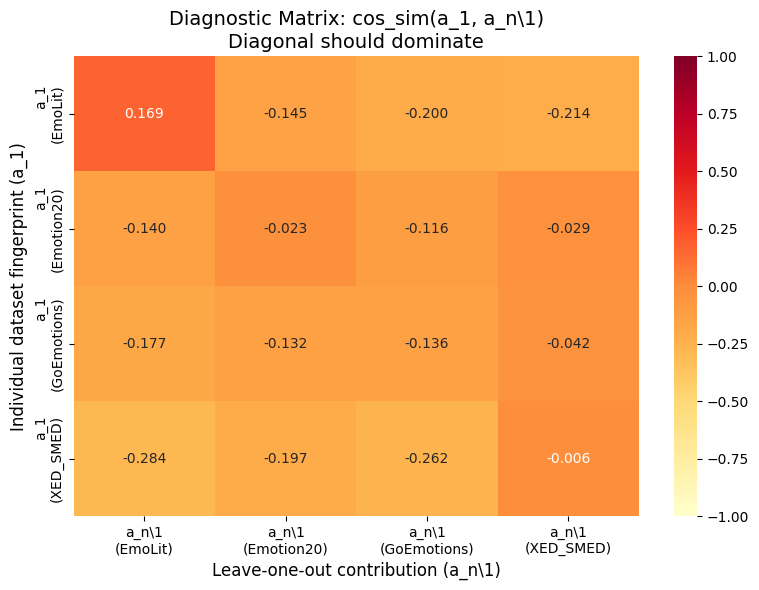

In [58]:
# ============================================================================
# Step 4: Visualize the Diagnostic Matrix
# ============================================================================

fig, ax = plt.subplots(figsize=(8, 6))

sns.heatmap(
    diagnostic_matrix,
    annot=True,
    fmt=".3f",
    cmap="YlOrRd",
    xticklabels=[f"a_n\\1\n({n})" for n in DATASET_NAMES],
    yticklabels=[f"a_1\n({n})" for n in DATASET_NAMES],
    vmin=-1, vmax=1,
    center=0,
    ax=ax,
)
ax.set_title("Diagnostic Matrix: cos_sim(a_1, a_n\\1)\nDiagonal should dominate", fontsize=14)
ax.set_xlabel("Leave-one-out contribution (a_n\\1)", fontsize=12)
ax.set_ylabel("Individual dataset fingerprint (a_1)", fontsize=12)

plt.tight_layout()
plt.show()

---
## Class-Level Diagnostic

Compute cosine similarity per emotion class column (not linearized).
For each class c: `D_c[i,j] = cos_sim(a_1_class_c[i], a_n1_class_c[j])`

In [59]:
# ============================================================================
# Step 5: Class-Level Cosine Similarity
# ============================================================================

# For each class, compute a 4x4 diagnostic matrix using only that class's column
class_diagnostics = {}

for class_idx, class_name in ID2LABEL.items():
    D_class = np.zeros((4, 4))
    for i, name_i in enumerate(DATASET_NAMES):
        for j, name_j in enumerate(DATASET_NAMES):
            # a_1 for class c: the class column from the aligned single-dataset matrix
            vec_1 = aligned_matrices[SINGLE_KEYS[i]][:, class_idx].reshape(1, -1)
            # a_n\1 for class c: alpha_n - alpha_{n-1} for that class column
            vec_n1 = (alpha_n_matrix[:, class_idx] - aligned_matrices[N1_KEYS[j]][:, class_idx]).reshape(1, -1)

            # Handle zero vectors
            if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                D_class[i, j] = 0.0
            else:
                D_class[i, j] = sklearn_cosine_sim(vec_1, vec_n1)[0, 0]

    class_diagnostics[class_name] = D_class

print("Class-level diagnostic matrices computed for all 9 emotions.")

Class-level diagnostic matrices computed for all 9 emotions.


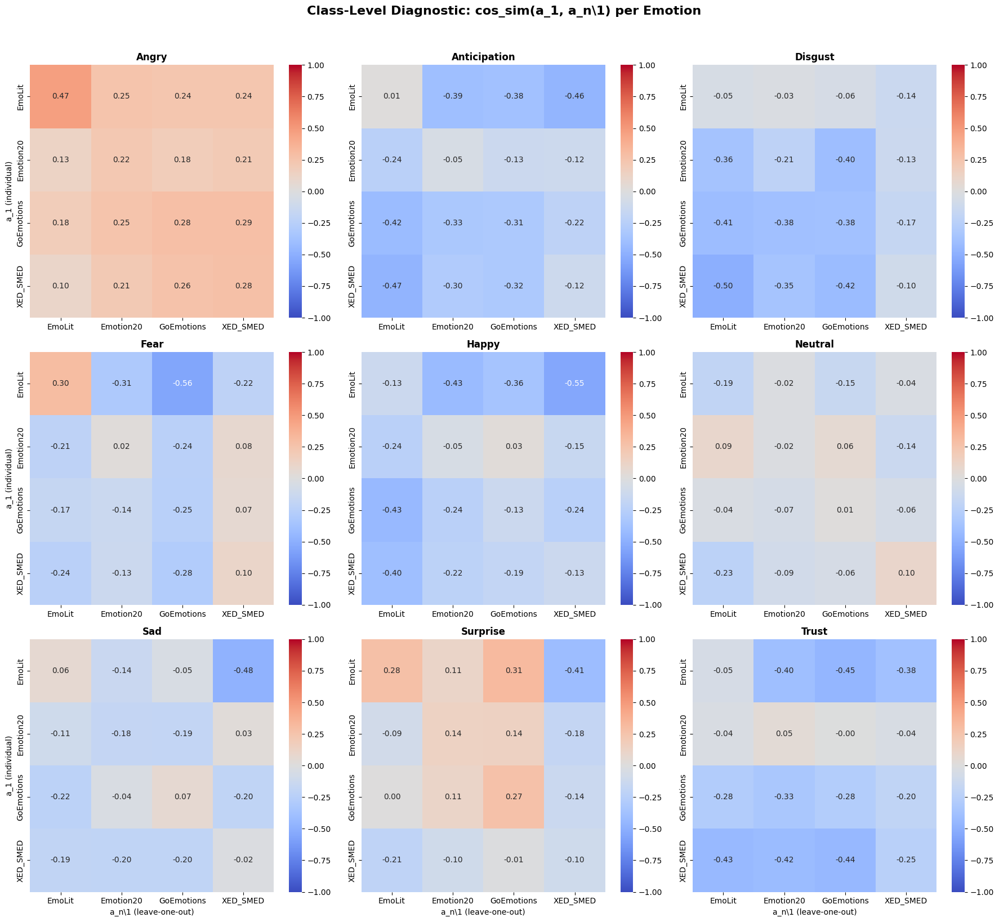

In [60]:
# ============================================================================
# Step 6: Visualize Class-Level Diagnostics (3x3 grid of heatmaps)
# ============================================================================

fig, axes = plt.subplots(3, 3, figsize=(18, 16))

for idx, (class_name, D_class) in enumerate(class_diagnostics.items()):
    row, col = divmod(idx, 3)
    ax = axes[row][col]

    sns.heatmap(
        D_class,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        vmin=-1, vmax=1,
        xticklabels=DATASET_NAMES,
        yticklabels=DATASET_NAMES,
        ax=ax,
    )
    ax.set_title(f"{class_name}", fontsize=12, fontweight='bold')

    # Only label outer axes
    if col > 0:
        ax.set_ylabel("")
    else:
        ax.set_ylabel("a_1 (individual)", fontsize=10)
    if row < 2:
        ax.set_xlabel("")
    else:
        ax.set_xlabel("a_n\\1 (leave-one-out)", fontsize=10)

fig.suptitle("Class-Level Diagnostic: cos_sim(a_1, a_n\\1) per Emotion",
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [61]:
# ============================================================================
# Step 7: Summary — diagonal dominance per class
# ============================================================================

print(f"{'CLASS':<15} | {'DIAG MEAN':>10} | {'OFF-DIAG MEAN':>14} | {'DOMINANT?':>10}")
print("-" * 60)

for class_name, D_class in class_diagnostics.items():
    diag_vals = np.diag(D_class)
    mask = ~np.eye(4, dtype=bool)
    off_diag_vals = D_class[mask]
    diag_mean = np.mean(diag_vals)
    off_diag_mean = np.mean(off_diag_vals)
    dominant = diag_mean > off_diag_mean
    print(f"{class_name:<15} | {diag_mean:>10.4f} | {off_diag_mean:>14.4f} | {'YES' if dominant else 'NO':>10}")

print(f"\n{'='*60}")
print("GLOBAL DIAGNOSTIC:")
diag_vals = np.diag(diagnostic_matrix)
mask = ~np.eye(4, dtype=bool)
off_diag_vals = diagnostic_matrix[mask]
print(f"  Diagonal mean:     {np.mean(diag_vals):.4f}")
print(f"  Off-diagonal mean: {np.mean(off_diag_vals):.4f}")
print(f"  Diagonal dominant: {'YES' if np.mean(diag_vals) > np.mean(off_diag_vals) else 'NO'}")

CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
------------------------------------------------------------
Angry           |     0.3146 |         0.2129 |        YES
Anticipation    |    -0.1184 |        -0.3132 |        YES
Disgust         |    -0.1850 |        -0.2796 |        YES
Fear            |     0.0430 |        -0.1955 |        YES
Happy           |    -0.1095 |        -0.2847 |        YES
Neutral         |    -0.0263 |        -0.0618 |        YES
Sad             |    -0.0170 |        -0.1654 |        YES
Surprise        |     0.1448 |        -0.0376 |        YES
Trust           |    -0.1339 |        -0.2844 |        YES

GLOBAL DIAGNOSTIC:
  Diagonal mean:     0.0011
  Off-diagonal mean: -0.1615
  Diagonal dominant: YES


In [62]:
# ============================================================================
# BEE Results for ALL classifiers — union keywords sorted alphabetically (A-Z)
# Styled with color gradients
# ============================================================================

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

all_config_keys = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
all_config_names = ["Full Dataset (alpha_n)"] + \
    [f"N-1: No {n}" for n in DATASET_NAMES] + \
    [f"Single: {n}" for n in DATASET_NAMES]

for config_key, config_name in zip(all_config_keys, all_config_names):
    matrix = aligned_matrices[config_key]  # shape: (num_keywords, 9)

    # Compute bias score
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)

    # Build DataFrame
    bee_df_aligned = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        bee_df_aligned[label] = matrix[:, class_idx]

    # Sort alphabetically by keyword
    bee_df_aligned = bee_df_aligned.sort_values("Keyword", ascending=True).reset_index(drop=True)

    print(f"\n{"="*80}")
    print(f"BEE RESULTS — {config_name} ({len(bee_df_aligned)} keywords, alphabetical)")
    print(f"{"="*80}")

    # Style: color the class columns with coolwarm, bias score with YlOrRd
    styled = bee_df_aligned.style \
        .background_gradient(subset=CANONICAL_LABELS, cmap="coolwarm", axis=None) \
        .background_gradient(subset=["Bias_Score"], cmap="YlOrRd") \
        .format({col: "{:.4f}" for col in CANONICAL_LABELS + ["Bias_Score"]}) \
        .set_caption(f"BEE — {config_name}")

    display(styled)


BEE RESULTS — Full Dataset (alpha_n) (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0635,-0.0423,-0.0048,-0.0100,-0.0383,0.0039,0.0212,-0.0161,-0.0148,0.0048
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0635,-0.0423,-0.0048,-0.0100,-0.0383,0.0039,0.0212,-0.0161,-0.0148,0.0048



BEE RESULTS — N-1: No EmoLit (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000



BEE RESULTS — N-1: No Emotion20 (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0550,-0.0147,-0.0222,-0.0107,-0.0386,-0.0151,0.0164,-0.0213,-0.0090,-0.0152
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0560,-0.0306,-0.0329,-0.0356,-0.0343,-0.0255,0.0204,-0.0045,-0.0136,-0.0116



BEE RESULTS — N-1: No GoEmotions (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0616,-0.0310,-0.0248,-0.0193,-0.0500,-0.0103,0.0094,-0.0180,0.0116,-0.0271
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0548,-0.0355,-0.0335,-0.0367,-0.0437,-0.0133,0.0111,-0.0098,0.0104,-0.0138



BEE RESULTS — N-1: No XED_SMED (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0766,-0.0258,-0.0240,-0.0091,-0.0477,-0.0080,0.0289,-0.0333,-0.0126,-0.0072
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0757,-0.0335,-0.0340,-0.0229,-0.0467,-0.0091,0.0290,-0.0211,-0.0143,-0.0047



BEE RESULTS — Single: EmoLit (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0943,-0.0246,-0.0097,0.0275,-0.0667,-0.0141,-0.0104,-0.0055,-0.0178,-0.0097
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0737,-0.0374,-0.0271,0.0116,-0.0597,-0.0208,-0.0055,0.0140,-0.0078,0.0038



BEE RESULTS — Single: Emotion20 (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.1070,-0.0342,-0.0453,-0.0564,-0.0952,-0.0057,-0.0014,-0.0043,-0.0155,0.0118
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000



BEE RESULTS — Single: GoEmotions (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0742,-0.0314,-0.0323,-0.0221,-0.0547,0.0070,0.0196,0.0030,-0.0276,-0.0158
2,Amazing,0.1339,-0.0738,0.0051,-0.0145,-0.0789,0.0550,-0.0101,-0.0448,0.0025,0.0080
3,America,0.0620,-0.0103,-0.0272,-0.0264,-0.0373,-0.0035,0.0247,-0.0119,-0.0196,-0.0202
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0852,-0.0084,-0.0053,0.0037,-0.0546,0.0306,-0.0236,-0.0078,-0.0094,-0.0220
6,Canada,0.0573,-0.0127,-0.0279,-0.0206,-0.0239,-0.0204,0.0294,-0.0081,-0.0241,-0.0128
7,Change,0.1007,-0.0072,-0.0209,-0.0178,-0.0685,-0.0317,0.0322,-0.0186,-0.0128,0.0055
8,Check,0.0996,-0.0223,0.0207,-0.0219,-0.0789,-0.0284,0.0175,-0.0324,-0.0046,-0.0056
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000



BEE RESULTS — Single: XED_SMED (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [64]:
# ============================================================================
# Export ALL BEE tables to a single colored Excel file
# One sheet per classifier + one "Side by Side" sheet
# ============================================================================
!pip install -q openpyxl

import openpyxl
from openpyxl.styles import PatternFill, Font, Alignment, Border, Side
from openpyxl.utils import get_column_letter
import colorsys

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

all_config_keys = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
all_config_names = ["Full (alpha_n)", "N-1 No EmoLit", "N-1 No Emotion20", "N-1 No GoEmotions", "N-1 No XED_SMED",
                    "Single EmoLit", "Single Emotion20", "Single GoEmotions", "Single XED_SMED"]

def value_to_coolwarm_hex(val, vmin, vmax):
    """Map a value to a coolwarm color (blue=low, white=mid, red=high)."""
    if vmax == vmin:
        return "FFFFFF"
    t = (val - vmin) / (vmax - vmin)  # 0 to 1
    # Blue (0) -> White (0.5) -> Red (1)
    if t < 0.5:
        r = int(255 * (2 * t) + 59 * (1 - 2 * t))
        g = int(255 * (2 * t) + 76 * (1 - 2 * t))
        b = int(255 * (2 * t) + 192 * (1 - 2 * t) + 255 * (1 - 2 * t) * 0)
        b = min(255, int(192 + (255 - 192) * (1 - 2 * t)))
        r = min(255, int(59 + (255 - 59) * (2 * t)))
        g = min(255, int(76 + (255 - 76) * (2 * t)))
    else:
        t2 = (t - 0.5) * 2
        r = 255
        g = int(255 * (1 - t2))
        b = int(255 * (1 - t2))
    return f"{min(255,max(0,r)):02X}{min(255,max(0,g)):02X}{min(255,max(0,b)):02X}"

def value_to_ylorrd_hex(val, vmin, vmax):
    """Map a value to YlOrRd (yellow=low, red=high)."""
    if vmax == vmin:
        return "FFFFB2"
    t = (val - vmin) / (vmax - vmin)
    r = 255
    g = int(255 * (1 - t * 0.7))
    b = int(178 * (1 - t))
    return f"{min(255,max(0,r)):02X}{min(255,max(0,g)):02X}{min(255,max(0,b)):02X}"

# Build all DataFrames (alphabetical order)
all_dfs = {}
for config_key, config_name in zip(all_config_keys, all_config_names):
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    df = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        df[label] = matrix[:, class_idx]
    df = df.sort_values("Keyword", ascending=True).reset_index(drop=True)
    all_dfs[config_name] = df

# --- Create Excel workbook ---
wb = openpyxl.Workbook()
wb.remove(wb.active)

header_font = Font(bold=True, size=11)
thin_border = Border(
    left=Side(style="thin"), right=Side(style="thin"),
    top=Side(style="thin"), bottom=Side(style="thin")
)

# Get global min/max for consistent coloring across sheets
all_class_vals = []
all_bias_vals = []
for df in all_dfs.values():
    all_class_vals.extend(df[CANONICAL_LABELS].values.flatten().tolist())
    all_bias_vals.extend(df["Bias_Score"].values.tolist())
class_vmin, class_vmax = min(all_class_vals), max(all_class_vals)
bias_vmin, bias_vmax = min(all_bias_vals), max(all_bias_vals)

# --- Individual sheets ---
for config_name, df in all_dfs.items():
    sheet_name = config_name[:31]  # Excel sheet name limit
    ws = wb.create_sheet(title=sheet_name)
    cols = list(df.columns)

    # Header row
    for col_idx, col_name in enumerate(cols, 1):
        cell = ws.cell(row=1, column=col_idx, value=col_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    # Data rows
    for row_idx, (_, row) in enumerate(df.iterrows(), 2):
        for col_idx, col_name in enumerate(cols, 1):
            val = row[col_name]
            cell = ws.cell(row=row_idx, column=col_idx, value=val)
            cell.border = thin_border

            if col_name in CANONICAL_LABELS:
                cell.number_format = "0.0000"
                color = value_to_coolwarm_hex(val, class_vmin, class_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")
            elif col_name == "Bias_Score":
                cell.number_format = "0.0000"
                color = value_to_ylorrd_hex(val, bias_vmin, bias_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    # Auto-width
    for col_idx in range(1, len(cols) + 1):
        ws.column_dimensions[get_column_letter(col_idx)].width = 14
    ws.column_dimensions["A"].width = 20

# --- Side by Side sheet ---
ws_sbs = wb.create_sheet(title="Side by Side", index=0)

# For side-by-side: each classifier gets Keyword + 9 class columns, separated by a gap
block_width = 1 + len(CANONICAL_LABELS)  # Keyword + 9 classes
gap = 1
start_col = 1

for cfg_idx, (config_name, df) in enumerate(all_dfs.items()):
    col_offset = start_col + cfg_idx * (block_width + gap)

    # Title row
    title_cell = ws_sbs.cell(row=1, column=col_offset, value=config_name)
    title_cell.font = Font(bold=True, size=12)

    # Header row
    headers = ["Keyword"] + CANONICAL_LABELS
    for h_idx, h_name in enumerate(headers):
        cell = ws_sbs.cell(row=2, column=col_offset + h_idx, value=h_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    # Data
    for row_idx, (_, row) in enumerate(df.iterrows(), 3):
        # Keyword
        cell = ws_sbs.cell(row=row_idx, column=col_offset, value=row["Keyword"])
        cell.border = thin_border

        # Class values
        for c_idx, label in enumerate(CANONICAL_LABELS):
            val = row[label]
            cell = ws_sbs.cell(row=row_idx, column=col_offset + 1 + c_idx, value=val)
            cell.number_format = "0.0000"
            cell.border = thin_border
            color = value_to_coolwarm_hex(val, class_vmin, class_vmax)
            cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    # Column widths
    ws_sbs.column_dimensions[get_column_letter(col_offset)].width = 18
    for c_idx in range(len(CANONICAL_LABELS)):
        ws_sbs.column_dimensions[get_column_letter(col_offset + 1 + c_idx)].width = 13

# Save
excel_path = "/content/BEE_all_classifiers.xlsx"
wb.save(excel_path)
print(f"Saved to {excel_path}")

# Download
from google.colab import files
files.download(excel_path)

Saved to /content/BEE_all_classifiers.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [67]:
# ============================================================================
# Export BEE Scores ONLY — PAIRED: n-1 next to single for each dataset
# ============================================================================

all_dfs_bias = {}
for config_key, config_name in zip(all_config_keys_ordered, all_config_names_ordered):
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    df = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    df = df.sort_values("Keyword", ascending=True).reset_index(drop=True)
    all_dfs_bias[config_name] = df

all_bias_vals = []
for df in all_dfs_bias.values():
    all_bias_vals.extend(df["Bias_Score"].values.tolist())
bias_vmin_b, bias_vmax_b = min(all_bias_vals), max(all_bias_vals)

wb2 = openpyxl.Workbook()
wb2.remove(wb2.active)

bias_block_width = 2  # Keyword + Bias_Score

def write_bias_block(ws, col_offset, start_row, title, df):
    cell = ws.cell(row=start_row, column=col_offset, value=title)
    cell.font = Font(bold=True, size=12)

    for h_idx, h_name in enumerate(["Keyword", "Bias_Score"]):
        cell = ws.cell(row=start_row + 1, column=col_offset + h_idx, value=h_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    for row_idx, (_, row_data) in enumerate(df.iterrows(), start_row + 2):
        cell = ws.cell(row=row_idx, column=col_offset, value=row_data["Keyword"])
        cell.border = thin_border

        val = row_data["Bias_Score"]
        cell = ws.cell(row=row_idx, column=col_offset + 1, value=val)
        cell.number_format = "0.0000"
        cell.border = thin_border
        color = value_to_ylorrd_hex(val, bias_vmin_b, bias_vmax_b)
        cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    ws.column_dimensions[get_column_letter(col_offset)].width = 18
    ws.column_dimensions[get_column_letter(col_offset + 1)].width = 14

n1_names = [f"N-1 No {n}" for n in DATASET_NAMES]
single_names = [f"Single {n}" for n in DATASET_NAMES]

# --- Sheet 1: Paired ---
ws_p = wb2.create_sheet(title="Paired (n-1 vs single)", index=0)

for ds_idx, ds_name in enumerate(DATASET_NAMES):
    pair_offset = ds_idx * (2 * bias_block_width + 3)
    col_left = 1 + pair_offset
    col_right = col_left + bias_block_width + 1

    write_bias_block(ws_p, col_left, 1, f"N-1 (no {ds_name})", all_dfs_bias[n1_names[ds_idx]])
    write_bias_block(ws_p, col_right, 1, f"Single ({ds_name})", all_dfs_bias[single_names[ds_idx]])

# --- Sheet 2: All ---
ws_a = wb2.create_sheet(title="All classifiers")
for cfg_idx, (config_name, df) in enumerate(all_dfs_bias.items()):
    col_offset = 1 + cfg_idx * (bias_block_width + 1)
    write_bias_block(ws_a, col_offset, 1, config_name, df)

# --- Individual pair sheets ---
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    ws = wb2.create_sheet(title=f"{ds_name}"[:31])
    write_bias_block(ws, 1, 1, f"N-1 (no {ds_name})", all_dfs_bias[n1_names[ds_idx]])
    write_bias_block(ws, bias_block_width + 2, 1, f"Single ({ds_name})", all_dfs_bias[single_names[ds_idx]])
    write_bias_block(ws, 2 * (bias_block_width + 1) + 1, 1, "Full (alpha_n)", all_dfs_bias["Full (alpha_n)"])

excel_path2 = "/content/BEE_bias_scores_paired.xlsx"
wb2.save(excel_path2)
print(f"Saved to {excel_path2}")

from google.colab import files
files.download(excel_path2)

Saved to /content/BEE_bias_scores_paired.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [66]:
# ============================================================================
# Export BEE Cosine Similarities — PAIRED: n-1 next to single for each dataset
# ============================================================================

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

# Build all DataFrames
all_dfs = {}
all_config_keys_ordered = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
all_config_names_ordered = ["Full (alpha_n)"] + \
    [f"N-1 No {n}" for n in DATASET_NAMES] + \
    [f"Single {n}" for n in DATASET_NAMES]

for config_key, config_name in zip(all_config_keys_ordered, all_config_names_ordered):
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    df = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        df[label] = matrix[:, class_idx]
    df = df.sort_values("Keyword", ascending=True).reset_index(drop=True)
    all_dfs[config_name] = df

# Global min/max for consistent coloring
all_class_vals = []
all_bias_vals = []
for df in all_dfs.values():
    all_class_vals.extend(df[CANONICAL_LABELS].values.flatten().tolist())
    all_bias_vals.extend(df["Bias_Score"].values.tolist())
class_vmin, class_vmax = min(all_class_vals), max(all_class_vals)
bias_vmin, bias_vmax = min(all_bias_vals), max(all_bias_vals)

wb = openpyxl.Workbook()
wb.remove(wb.active)

cols_per_block = 1 + 1 + len(CANONICAL_LABELS)  # Keyword + Bias_Score + 9 classes = 11
gap = 1

def write_block(ws, col_offset, start_row, title, df):
    """Write one classifier block at the given column offset."""
    # Title
    cell = ws.cell(row=start_row, column=col_offset, value=title)
    cell.font = Font(bold=True, size=12)

    # Headers
    headers = ["Keyword", "Bias_Score"] + CANONICAL_LABELS
    for h_idx, h_name in enumerate(headers):
        cell = ws.cell(row=start_row + 1, column=col_offset + h_idx, value=h_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    # Data rows
    for row_idx, (_, row_data) in enumerate(df.iterrows(), start_row + 2):
        for h_idx, col_name in enumerate(headers):
            val = row_data[col_name]
            cell = ws.cell(row=row_idx, column=col_offset + h_idx, value=val)
            cell.border = thin_border
            if col_name in CANONICAL_LABELS:
                cell.number_format = "0.0000"
                color = value_to_coolwarm_hex(val, class_vmin, class_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")
            elif col_name == "Bias_Score":
                cell.number_format = "0.0000"
                color = value_to_ylorrd_hex(val, bias_vmin, bias_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    # Column widths
    ws.column_dimensions[get_column_letter(col_offset)].width = 18
    for h_idx in range(1, len(headers)):
        ws.column_dimensions[get_column_letter(col_offset + h_idx)].width = 13

# --- Sheet 1: "Paired" — for each dataset: N-1 | Single side by side ---
ws_paired = wb.create_sheet(title="Paired (n-1 vs single)", index=0)

n1_names = [f"N-1 No {n}" for n in DATASET_NAMES]
single_names = [f"Single {n}" for n in DATASET_NAMES]

for ds_idx, ds_name in enumerate(DATASET_NAMES):
    # Each pair takes 2 blocks + 1 gap between them + 2 gap to next pair
    pair_offset = ds_idx * (2 * cols_per_block + 3)
    col_left = 1 + pair_offset
    col_right = col_left + cols_per_block + gap

    write_block(ws_paired, col_left, 1, f"N-1 (no {ds_name})", all_dfs[n1_names[ds_idx]])
    write_block(ws_paired, col_right, 1, f"Single ({ds_name})", all_dfs[single_names[ds_idx]])

# --- Sheet 2: "All" — alpha_n + all 8 classifiers ---
ws_all = wb.create_sheet(title="All classifiers")

for cfg_idx, (config_name, df) in enumerate(all_dfs.items()):
    col_offset = 1 + cfg_idx * (cols_per_block + gap)
    write_block(ws_all, col_offset, 1, config_name, df)

# --- Individual sheets for each pair ---
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    ws = wb.create_sheet(title=f"{ds_name}"[:31])
    write_block(ws, 1, 1, f"N-1 (no {ds_name})", all_dfs[n1_names[ds_idx]])
    write_block(ws, cols_per_block + 2, 1, f"Single ({ds_name})", all_dfs[single_names[ds_idx]])
    # Also add alpha_n for reference
    write_block(ws, 2 * (cols_per_block + 1) + 1, 1, "Full (alpha_n)", all_dfs["Full (alpha_n)"])

excel_path = "/content/BEE_cosine_paired.xlsx"
wb.save(excel_path)
print(f"Saved to {excel_path}")

from google.colab import files
files.download(excel_path)

Saved to /content/BEE_cosine_paired.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ============================================================================
# Export PCB (Pearson Correlation Bias) Scores to Excel
# One sheet per classifier configuration
# ============================================================================

pcb_excel_path = "/content/PCB_all_classifiers.xlsx"

# Collect all PCB DataFrames from the pipeline results
pcb_dfs = {}
for config_key, config_name in zip(all_config_keys, all_config_names):
    if config_key in all_bee_results and "pcb_df" in all_bee_results[config_key]:
        pcb_dfs[config_name] = all_bee_results[config_key]["pcb_df"]

if pcb_dfs:
    wb_pcb = openpyxl.Workbook()
    wb_pcb.remove(wb_pcb.active)

    for config_name, df in pcb_dfs.items():
        sheet_name = config_name[:31]
        ws = wb_pcb.create_sheet(title=sheet_name)
        cols = list(df.columns)

        # Header row
        for col_idx, col_name in enumerate(cols, 1):
            cell = ws.cell(row=1, column=col_idx, value=col_name)
            cell.font = Font(bold=True, size=11)

        # Data rows
        for row_idx, (_, row) in enumerate(df.iterrows(), 2):
            for col_idx, col_name in enumerate(cols, 1):
                val = row[col_name]
                cell = ws.cell(row=row_idx, column=col_idx, value=val)
                if col_name != "Keyword":
                    cell.number_format = "0.0000"

        # Auto-width
        for col_idx in range(1, len(cols) + 1):
            ws.column_dimensions[get_column_letter(col_idx)].width = 14
        ws.column_dimensions["A"].width = 20

    wb_pcb.save(pcb_excel_path)
    print(f"PCB scores exported to: {pcb_excel_path}")
    print(f"  Sheets: {list(pcb_dfs.keys())}")
else:
    print("No PCB results found in all_bee_results.")

Top 15 keywords (alphabetical from union): ['Amazing', 'Change', 'Check', 'English', 'German', 'Indian', 'Joy', 'Lmao', 'Loves', 'Ugh', 'Wow', 'art', 'beautiful', 'bit', 'body']


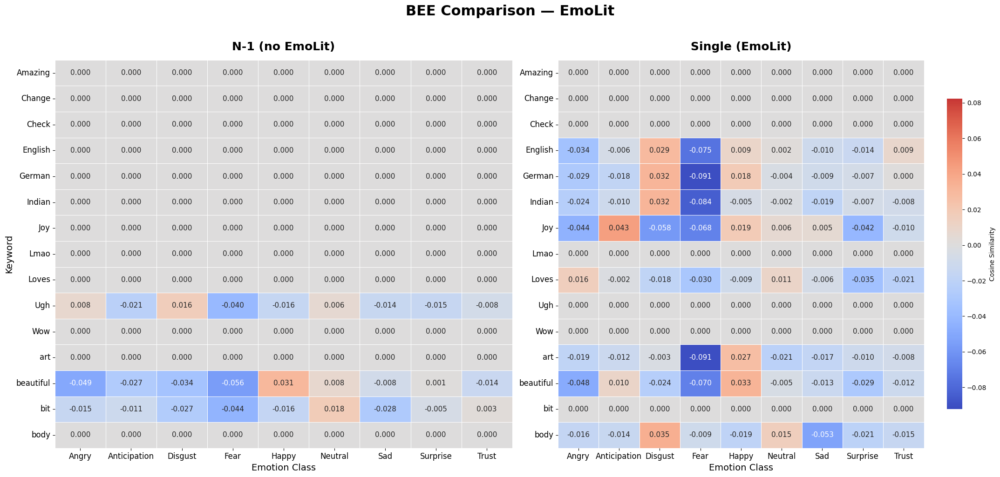

Saved: BEE_paired_EmoLit.png


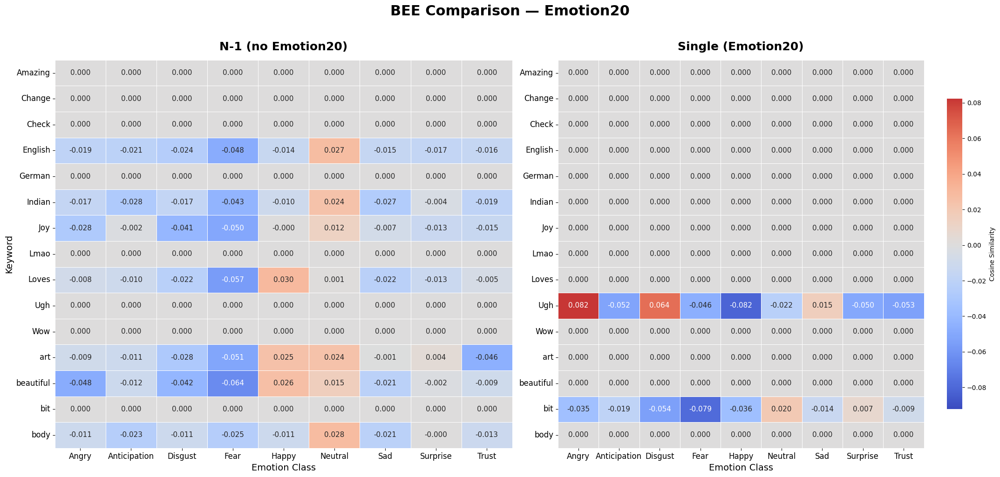

Saved: BEE_paired_Emotion20.png


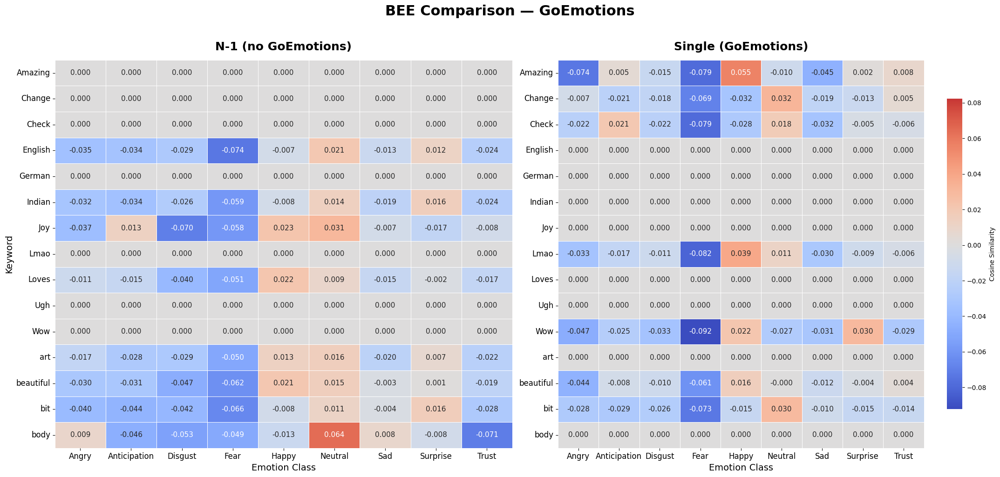

Saved: BEE_paired_GoEmotions.png


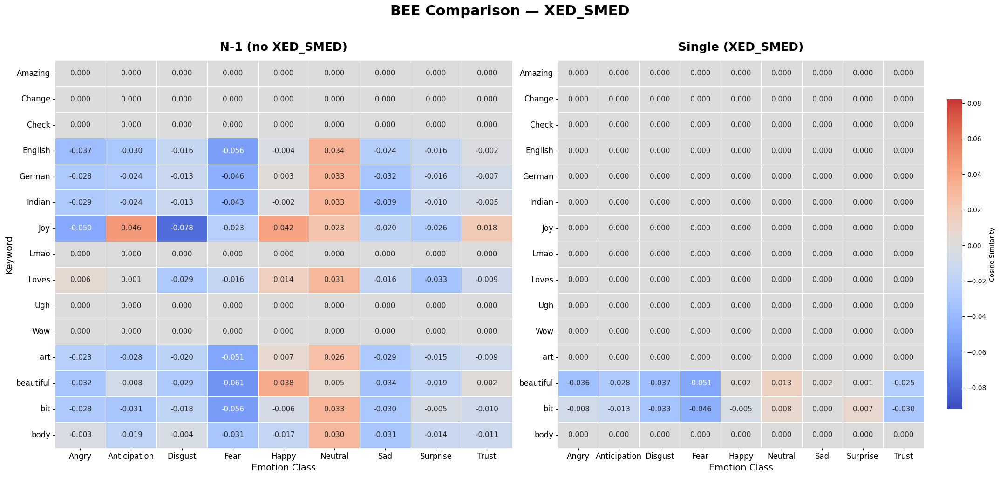

Saved: BEE_paired_XED_SMED.png


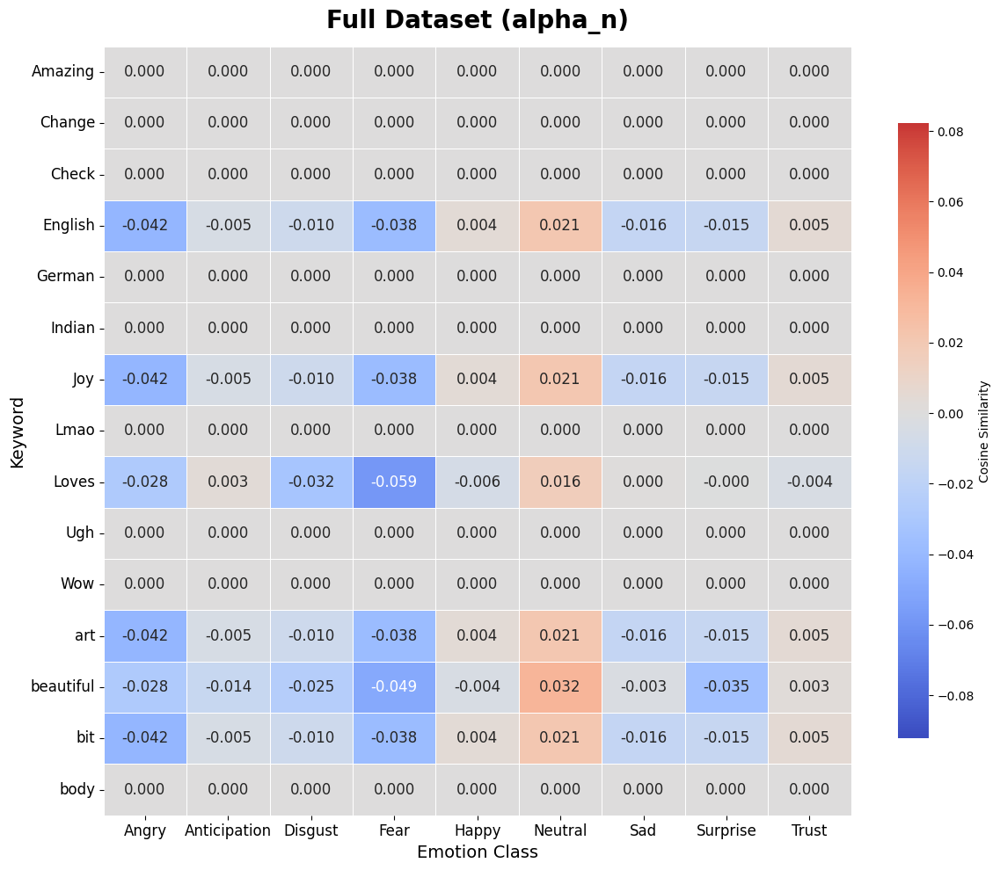

Saved: BEE_alpha_n_reference.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [68]:
# ============================================================================
# Paired BEE Heatmap Plots: N-1 vs Single for each dataset
# Same 15 keywords across all plots (top 15 union, alphabetically first 15)
# ============================================================================

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

# Step 1: Collect top 15 keywords by BEE score from each classifier
top_keywords_set = set()
for config_key in ["alpha_n"] + N1_KEYS + SINGLE_KEYS:
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    top_indices = np.argsort(bias_scores)[::-1][:15]
    for idx in top_indices:
        top_keywords_set.add(all_keywords_union[idx])

# Step 2: Sort alphabetically, take first 15
plot_keywords = sorted(top_keywords_set)[:15]
plot_kw_indices = [all_keywords_union.index(kw) for kw in plot_keywords]

print(f"Top 15 keywords (alphabetical from union): {plot_keywords}")

# Step 3: Global min/max for consistent color scale across all plots
all_vals = []
for config_key in ["alpha_n"] + N1_KEYS + SINGLE_KEYS:
    matrix = aligned_matrices[config_key]
    sub = matrix[plot_kw_indices]
    all_vals.extend(sub.flatten().tolist())
vmin_global, vmax_global = min(all_vals), max(all_vals)

# Step 4: Make paired plots
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    n1_key = N1_KEYS[ds_idx]
    single_key = SINGLE_KEYS[ds_idx]

    n1_matrix = aligned_matrices[n1_key][plot_kw_indices]  # (15, 9)
    single_matrix = aligned_matrices[single_key][plot_kw_indices]  # (15, 9)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10), sharey=False)

    # Left: N-1
    sns.heatmap(
        n1_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", center=0, vmin=vmin_global, vmax=vmax_global,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax1, linewidths=0.5, linecolor="white",
        cbar=False,
    )
    ax1.set_title(f"N-1 (no {ds_name})", fontsize=18, fontweight="bold", pad=15)
    ax1.set_xlabel("Emotion Class", fontsize=14)
    ax1.set_ylabel("Keyword", fontsize=14)
    ax1.tick_params(labelsize=12)

    # Right: Single
    sns.heatmap(
        single_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", center=0, vmin=vmin_global, vmax=vmax_global,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax2, linewidths=0.5, linecolor="white",
        cbar_kws={"shrink": 0.8, "label": "Cosine Similarity"},
    )
    ax2.set_title(f"Single ({ds_name})", fontsize=18, fontweight="bold", pad=15)
    ax2.set_xlabel("Emotion Class", fontsize=14)
    ax2.tick_params(labelsize=12)

    fig.suptitle(f"BEE Comparison — {ds_name}", fontsize=22, fontweight="bold", y=1.02)
    plt.tight_layout()

    fname = f"BEE_paired_{ds_name}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {fname}")

# Also make one with alpha_n for reference
fig, ax = plt.subplots(figsize=(12, 10))
alpha_n_matrix = aligned_matrices["alpha_n"][plot_kw_indices]
sns.heatmap(
    alpha_n_matrix,
    annot=True, fmt=".3f", annot_kws={"size": 12},
    cmap="coolwarm", center=0, vmin=vmin_global, vmax=vmax_global,
    xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
    ax=ax, linewidths=0.5, linecolor="white",
    cbar_kws={"shrink": 0.8, "label": "Cosine Similarity"},
)
ax.set_title("Full Dataset (alpha_n)", fontsize=20, fontweight="bold", pad=15)
ax.set_xlabel("Emotion Class", fontsize=14)
ax.set_ylabel("Keyword", fontsize=14)
ax.tick_params(labelsize=12)
plt.tight_layout()
plt.savefig("BEE_alpha_n_reference.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: BEE_alpha_n_reference.png")

# Download all
from google.colab import files
for ds_name in DATASET_NAMES:
    files.download(f"BEE_paired_{ds_name}.png")
files.download("BEE_alpha_n_reference.png")

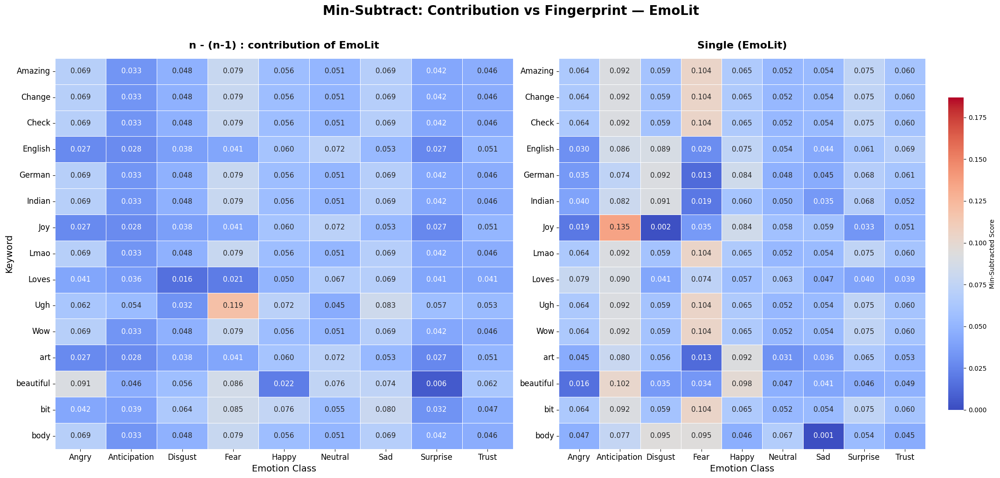

Saved: BEE_minsub_paired_EmoLit.png


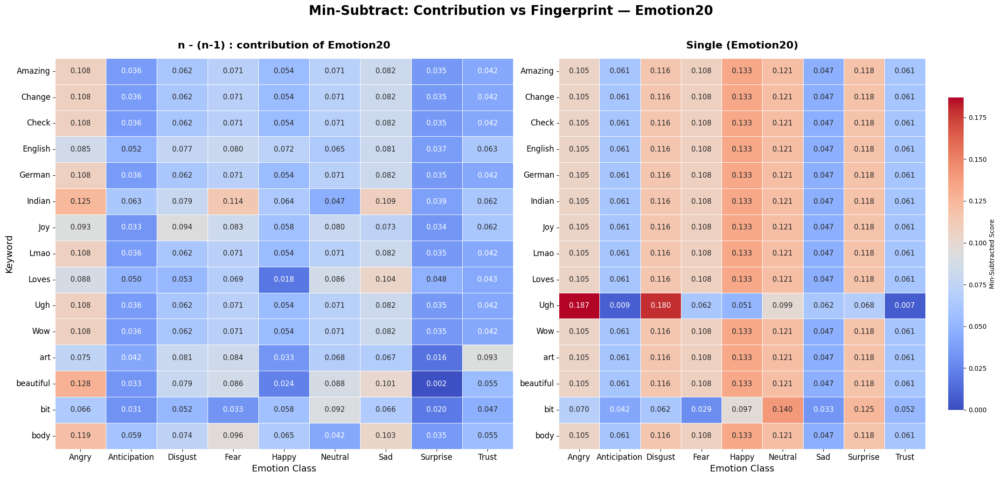

Saved: BEE_minsub_paired_Emotion20.png


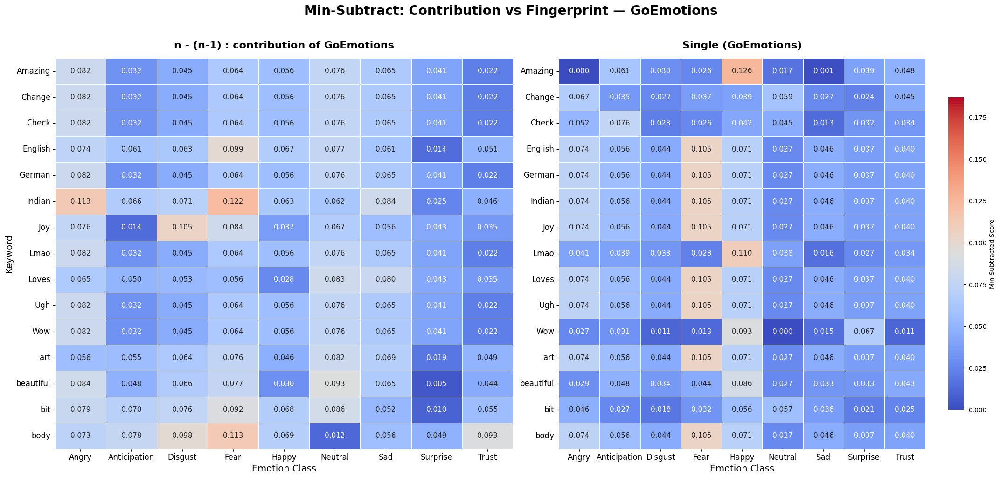

Saved: BEE_minsub_paired_GoEmotions.png


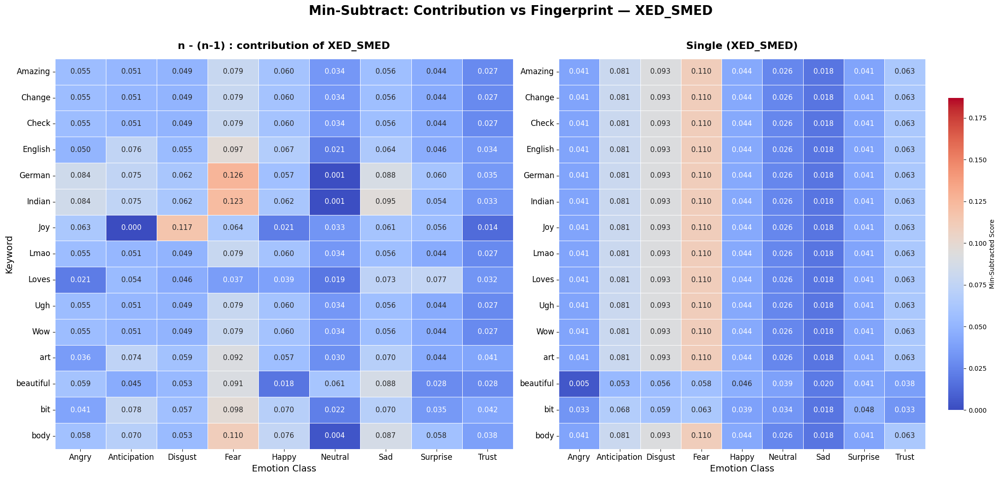

Saved: BEE_minsub_paired_XED_SMED.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [69]:
# ============================================================================
# Paired Heatmaps using MIN-SUBTRACT-PER-CLASS scoring
# Left:  a_{n\1,i} = alpha_n - alpha_{n-1,i}  (contribution of dataset i)
# Right: a_{1,i}   = alpha_{1,i}               (single dataset fingerprint)
# Both transformed with min-subtract-per-class before plotting
# ============================================================================

def min_subtract_per_class(matrix, emotion_cols):
    """
    For each class (column), subtract the minimum across all keywords.
    score(class, keyword) = sim(class, keyword) - min_keyword(sim(class))
    """
    import pandas as pd
    df = pd.DataFrame(matrix, columns=emotion_cols)
    col_mins = df.min(axis=0)
    return (df.subtract(col_mins, axis=1)).values

# Compute (alpha_n - alpha_{n-1}) for each dataset, then apply min-subtract
alpha_n_matrix = aligned_matrices["alpha_n"]  # (num_kw, 9)

aligned_matrices_minsub_left = {}   # n - (n-1)
aligned_matrices_minsub_right = {}  # single

for ds_idx, ds_name in enumerate(DATASET_NAMES):
    n1_key = N1_KEYS[ds_idx]
    single_key = SINGLE_KEYS[ds_idx]

    # Left: contribution = alpha_n - alpha_{n-1}
    diff_matrix = alpha_n_matrix - aligned_matrices[n1_key]
    aligned_matrices_minsub_left[ds_name] = min_subtract_per_class(diff_matrix, CANONICAL_LABELS)

    # Right: single dataset fingerprint
    aligned_matrices_minsub_right[ds_name] = min_subtract_per_class(aligned_matrices[single_key], CANONICAL_LABELS)

# Global min/max for consistent color scale
all_vals_ms = []
for ds_name in DATASET_NAMES:
    sub_l = aligned_matrices_minsub_left[ds_name][plot_kw_indices]
    sub_r = aligned_matrices_minsub_right[ds_name][plot_kw_indices]
    all_vals_ms.extend(sub_l.flatten().tolist())
    all_vals_ms.extend(sub_r.flatten().tolist())
vmin_ms, vmax_ms = min(all_vals_ms), max(all_vals_ms)

# Paired plots
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    left_matrix = aligned_matrices_minsub_left[ds_name][plot_kw_indices]   # (15, 9)
    right_matrix = aligned_matrices_minsub_right[ds_name][plot_kw_indices]  # (15, 9)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10), sharey=False)

    # Left: n - (n-1)
    sns.heatmap(
        left_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", vmin=vmin_ms, vmax=vmax_ms,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax1, linewidths=0.5, linecolor="white",
        cbar=False,
    )
    ax1.set_title(f"n - (n-1) : contribution of {ds_name}", fontsize=16, fontweight="bold", pad=15)
    ax1.set_xlabel("Emotion Class", fontsize=14)
    ax1.set_ylabel("Keyword", fontsize=14)
    ax1.tick_params(labelsize=12)

    # Right: Single
    sns.heatmap(
        right_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", vmin=vmin_ms, vmax=vmax_ms,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax2, linewidths=0.5, linecolor="white",
        cbar_kws={"shrink": 0.8, "label": "Min-Subtracted Score"},
    )
    ax2.set_title(f"Single ({ds_name})", fontsize=16, fontweight="bold", pad=15)
    ax2.set_xlabel("Emotion Class", fontsize=14)
    ax2.tick_params(labelsize=12)

    fig.suptitle(f"Min-Subtract: Contribution vs Fingerprint — {ds_name}", fontsize=20, fontweight="bold", y=1.02)
    plt.tight_layout()

    fname = f"BEE_minsub_paired_{ds_name}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {fname}")

# Download all
from google.colab import files
for ds_name in DATASET_NAMES:
    files.download(f"BEE_minsub_paired_{ds_name}.png")